In [1]:
from importlib import reload
import sys
import os
sys.path.insert(0, './..')
sys.path.insert(0, './../scripts')

In [2]:
from importlib import reload

import pickle
import time
from tqdm import tqdm

import numpy as np
from scipy import linalg
from scipy import sparse
from scipy import ndimage
import cv2

import matplotlib as mpl
import matplotlib.pyplot as plt

import plot_func as pf
import util_func as uf

import dev_ori_sel_RF
from dev_ori_sel_RF import data_dir,network,connectivity,dynamics_np
from dev_ori_sel_RF.tools import misc,update_params_dict,gen_gaussian_random_field

2024-04-24 22:53:43.659966: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Please install GPU version of TF


# Define functions to simulate dynamics

In [3]:
N4 = 60
n_inp = 50
n_cnd = 3
eta = 1e-2

In [4]:
from scipy.integrate import solve_ivp

def fio_rect(x):
#     x[x<0] = 0
#     return x
    return np.fmax(x,0)

def dynamics_system(y,inp_ff,Wrec,\
                    gamma_rec,gamma_ff,tau):
#     argE = gamma_rec * np.dot(Wrec[:N],y) + gamma_ff * inp_ff[0]
#     argI = gamma_rec * np.dot(Wrec[N:],y) + gamma_ff * inp_ff[1]
#     return 1./tau*( -y + fio_rect(np.concatenate([argE,argI])))
    arg = gamma_rec * np.dot(Wrec,y) + gamma_ff * inp_ff
    return 1./tau*( -y + fio_rect(arg))

def integrate(y0,inp,dt,Nt,Wrec,gamma_rec=1.02):
    y = y0
    for t_idx in range(Nt):
        out = dynamics_system(y,inp,Wrec,gamma_rec,1.0,1.0)
        dy = out
        y = y + dt*dy
    return np.array([y[:N4**2].reshape((N4,N4)),y[N4**2:].reshape((N4,N4))])
#     def ode_fun(t,y):
#         return dynamics_system(y,inp,Wrec,gamma_rec,1.0,N4*N4,1.0)
#     sol = solve_ivp(ode_fun,[0,dt*Nt],y0,method='RK23',first_step=dt)
#     return np.array([sol.y[:N4**2,-1].reshape((N4,N4)),sol.y[N4**2:,-1].reshape((N4,N4))])

# Define bandpass filtered inputs

In [5]:
x,y = np.meshgrid(np.linspace(-N4//2,N4//2-1,N4),np.linspace(-N4//2,N4//2-1,N4))
sig1 = 1.8*6/5
sig2 = 3.6*6/5
kern1 = 1./(np.sqrt(np.pi*2)*sig1)**2*np.exp((-x**2-y**2)/2./sig1**2)
kern2 = 1./(np.sqrt(np.pi*2)*sig2)**2*np.exp((-x**2-y**2)/2./sig2**2)
diff_gauss = kern1-kern2

In [6]:
inps = np.zeros((n_inp,2,N4,N4))

ring_image = np.fft.fft2(np.fft.fftshift(diff_gauss))

rng = np.random.default_rng(0)
for inp_idx in tqdm(range(n_inp)):
    for pop_idx in range(2):
        random_matrix = np.fft.fft2(rng.normal(size=(N4,N4)))
        ring_ifft = np.real(np.fft.ifft2(ring_image*random_matrix))
        inps[inp_idx,pop_idx,:,:] = 1 + eta*ring_ifft

init_rates = np.zeros((n_inp*n_cnd,2,N4,N4))
rng = np.random.default_rng(0)
for idx in tqdm(range(n_inp*n_cnd)):
    init_rates[idx,:,:] = np.fmax(0,rng.normal(0.5,0.1,size=(2,N4,N4)))

100%|██████████| 150/150 [00:00<00:00, 2662.02it/s]


# Construct homogeneous recurrent weights

In [7]:
config_name = "big_homo"
# Version = -1
# config_dict,N4pop,Nlgnpop,Nret,Nlgn,N4,rA = uf.get_network_size(config_name,verbose=False)
    
# W4 = connectivity.Connectivity_2pop((N4,N4),(N4,N4),\
#                                     (N4,N4), (N4,N4),\
#                                     random_seed=config_dict["random_seed"],\
#                                     Nvert=1, verbose=True)

# start = time.process_time()

# Whomo,arbor4to4 = W4.create_matrix_2pop(config_dict["W4to4_params"],config_dict["W4to4_params"]["Wrec_mode"])

# print('Creating homogenous recurrent connectivity took',time.process_time() - start,'s')
# np.save('homo_W4to4_N4={:d}'.format(N4),Whomo)

Whomo = np.load('homo_W4to4_N4={:d}.npy'.format(N4))

Text(0.5, 1.0, 'L2/3 I Cell (Pre)')

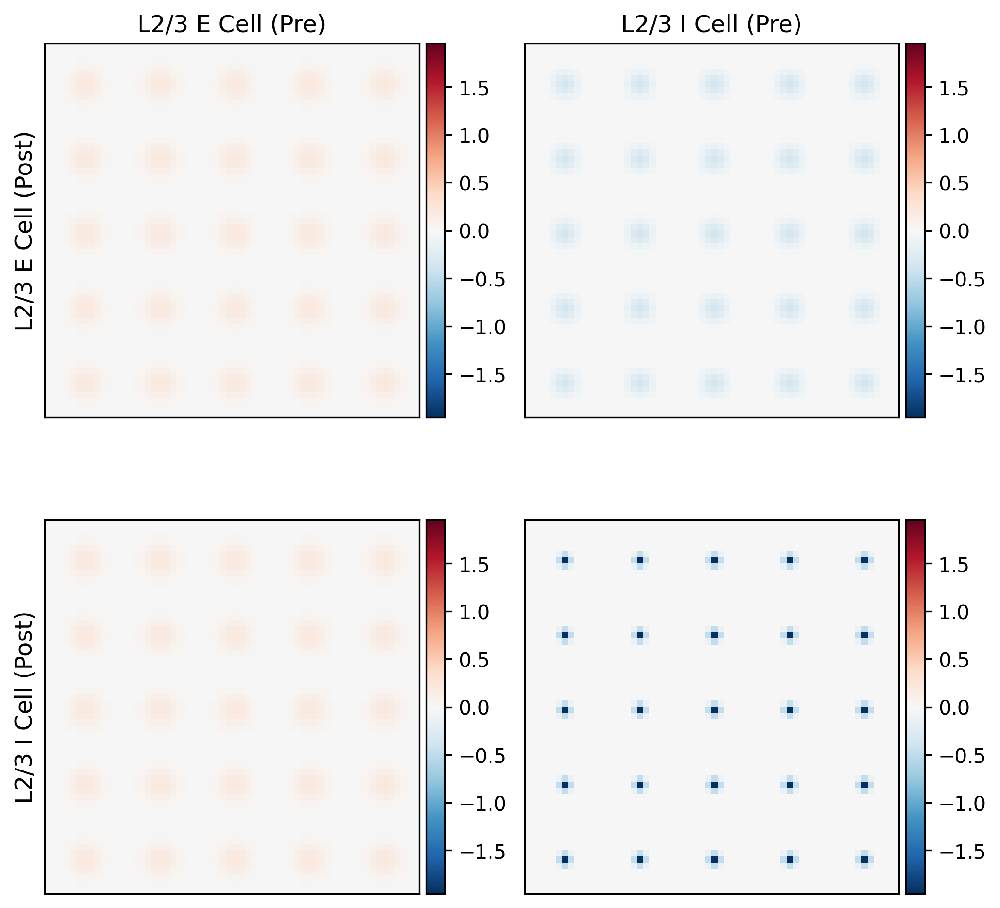

In [8]:
fig,axs = plt.subplots(2,2,figsize=(8,8),dpi=300)
fig.subplots_adjust(hspace=.2, wspace=.2)

WEE = np.zeros((N4,N4))
WEI = np.zeros((N4,N4))
WIE = np.zeros((N4,N4))
WII = np.zeros((N4,N4))

idxs = np.arange(N4//10,N4,N4//5)
for i in range(len(idxs)):
    for j in range(len(idxs)):
        rav_idx = np.ravel_multi_index([[idxs[i]],[idxs[j]]],(N4,N4))
        WEE += Whomo[:N4**2,:N4**2][:,rav_idx].reshape(N4,N4)
        WEI += Whomo[:N4**2,N4**2:][:,rav_idx].reshape(N4,N4)
        WIE += Whomo[N4**2:,:N4**2][:,rav_idx].reshape(N4,N4)
        WII += Whomo[N4**2:,N4**2:][:,rav_idx].reshape(N4,N4)

pf.imshowbar(fig,axs[0,0],WEE,
            vmin=-np.max(np.abs(Whomo)),vmax=np.max(np.abs(Whomo)),cmap='RdBu_r')
pf.imshowbar(fig,axs[0,1],WEI,
            vmin=-np.max(np.abs(Whomo)),vmax=np.max(np.abs(Whomo)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,0],WIE,
            vmin=-np.max(np.abs(Whomo)),vmax=np.max(np.abs(Whomo)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,1],WII,
            vmin=-np.max(np.abs(Whomo)),vmax=np.max(np.abs(Whomo)),cmap='RdBu_r')

axs[0,0].set_ylabel('L2/3 E Cell (Post)',fontsize=12)
axs[1,0].set_ylabel('L2/3 I Cell (Post)',fontsize=12)
axs[0,0].set_title('L2/3 E Cell (Pre)',fontsize=12)
axs[0,1].set_title('L2/3 I Cell (Pre)',fontsize=12)

# eigval,eigvec = sparse.linalg.eigs(Whomo,1,which='LR')
# print(eigval)

# Simulate dynamics with bandpass filtered inputs

In [9]:
# rates = np.zeros((n_inp*n_cnd,2,N4,N4))

# start = time.process_time()

# for inp_idx in tqdm(range(n_inp)):
#         for cnd_idx in tqdm(range(n_cnd), leave=False):
#             idx = inp_idx*n_cnd+cnd_idx
#             rates[idx] = integrate(init_rates[idx].flatten(),inps[inp_idx].flatten(),1/3,2000,Whomo)
    
# print('Simulating rate dynamics took',time.process_time() - start,'s')
# np.save('homo_rates_N4={:d}'.format(N4),rates.flatten())

rates = np.load('homo_rates_N4={:d}.npy'.format(N4)).reshape((n_inp*n_cnd,2,N4,N4))

100%|██████████| 50/50 [4:14:03<00:00, 304.87s/it]  


Simulating rate dynamics took 48329.856176 s


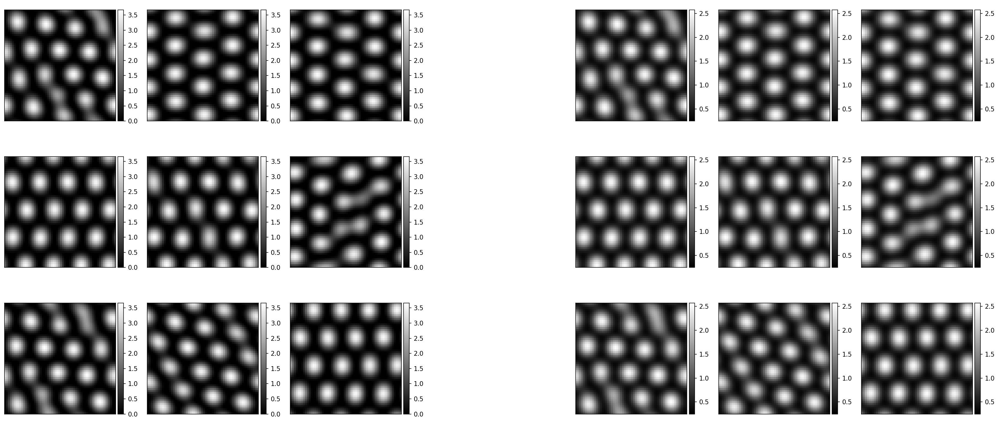

In [10]:
n_row = 3

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*4,n_row*4),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     rates[idx,0],cmap='binary_r',
                     vmin=np.min(rates[:,0]),vmax=np.max(rates[:,0]))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     rates[idx,1],cmap='binary_r',
                     vmin=np.min(rates[:,1]),vmax=np.max(rates[:,1]))

# Calculate the typical length scale

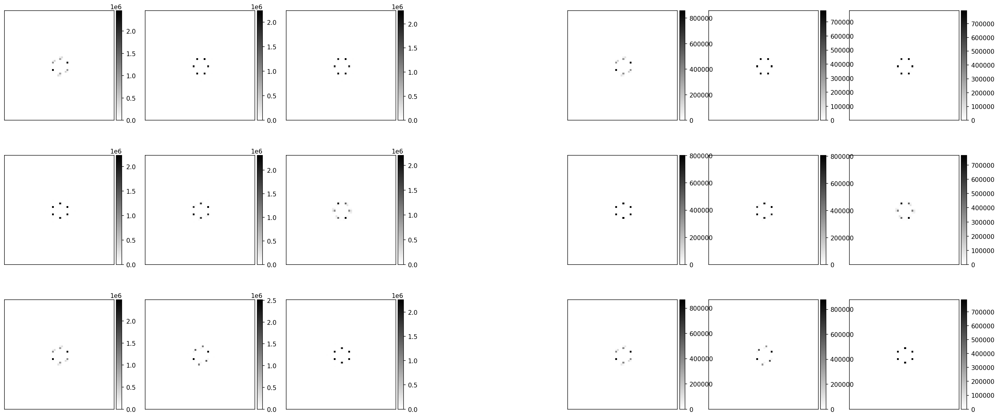

In [11]:
n_row = 3

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*4,n_row*4),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,0]-np.nanmean(rates[idx,0]))))**2,
                     cmap='binary')
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,1]-np.nanmean(rates[idx,1]))))**2,
                     cmap='binary')

In [12]:
# inp_fps_dat = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# inp_fps_err = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# rate_fps_dat = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# rate_fps_err = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
inp_fps_dat = np.zeros(N4//2)
inp_fps_err = np.zeros(N4//2)
rate_fps_dat = np.zeros(N4//2)
rate_fps_err = np.zeros(N4//2)

grid = np.arange(-N4//2,N4//2)
x,y = np.meshgrid(grid,grid)
bin_idxs = np.digitize(np.sqrt(x**2+y**2),np.arange(0,np.ceil(N4//2*np.sqrt(2)))+0.1)

for idx in range(n_inp):
    fp2 = np.abs(np.fft.fftshift(np.fft.fft2(inps[idx,0]-np.nanmean(inps[idx,0]))))**2
    for bin_idx in range(N4//2):
        inp_fps_dat[bin_idx] += np.mean(fp2[bin_idxs == bin_idx])
        inp_fps_err[bin_idx] += np.var(fp2[bin_idxs == bin_idx])
        
    fp2 = np.abs(np.fft.fftshift(np.fft.fft2(inps[idx,1]-np.nanmean(inps[idx,1]))))**2
    for bin_idx in range(N4//2):
        inp_fps_dat[bin_idx] += np.mean(fp2[bin_idxs == bin_idx])
        inp_fps_err[bin_idx] += np.var(fp2[bin_idxs == bin_idx])
    
    fp2 = np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,0]-np.nanmean(rates[idx,0]))))**2
    for bin_idx in range(N4//2):
        rate_fps_dat[bin_idx] += np.mean(fp2[bin_idxs == bin_idx])
        rate_fps_err[bin_idx] += np.var(fp2[bin_idxs == bin_idx])
        
    fp2 = np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,1]-np.nanmean(rates[idx,1]))))**2
    for bin_idx in range(N4//2):
        rate_fps_dat[bin_idx] += np.mean(fp2[bin_idxs == bin_idx])
        rate_fps_err[bin_idx] += np.var(fp2[bin_idxs == bin_idx])

inp_fps_dat /= 2*n_inp
inp_fps_err /= 2*n_inp
inp_fps_err = np.sqrt(inp_fps_err / (2*n_inp))
rate_fps_dat /= 2*n_inp
rate_fps_err /= 2*n_inp
rate_fps_err = np.sqrt(rate_fps_err / (2*n_inp))

(0.0, 51.66921150573151)

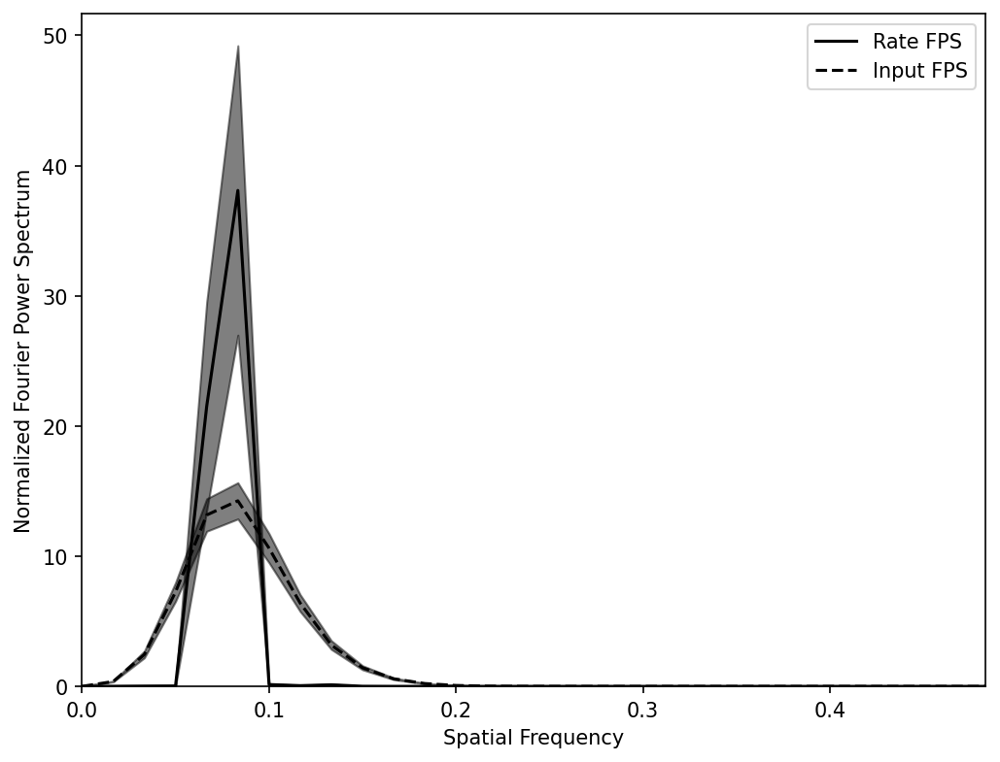

In [13]:
fig,axs = plt.subplots(1,1,figsize=(8,6),dpi=150)

freqs = np.arange(N4//2)/N4

axs.plot(freqs,rate_fps_dat/np.sum(rate_fps_dat)*N4,'k',label='Rate FPS')
axs.fill_between(freqs,(rate_fps_dat+rate_fps_err)/np.sum(rate_fps_dat)*N4,
                 (rate_fps_dat-rate_fps_err)/np.sum(rate_fps_dat)*N4,
                 color='k',alpha=0.5)
axs.plot(freqs,inp_fps_dat/np.sum(inp_fps_dat)*N4,'k--',label='Input FPS')
axs.fill_between(freqs,(inp_fps_dat+inp_fps_err)/np.sum(inp_fps_dat)*N4,
                 (inp_fps_dat-inp_fps_err)/np.sum(inp_fps_dat)*N4,
                 color='k',alpha=0.5)
axs.legend()

axs.set_xlabel('Spatial Frequency')
axs.set_ylabel('Normalized Fourier Power Spectrum')

axs.set_xlim(0,(N4//2-1)/N4)
axs.set_ylim(0,None)

In [14]:
Lam = 1/freqs[np.argmax(rate_fps_dat)]
print('Λ =',Lam)

Λ = 12.0


# Calculate correlation patterns

In [15]:
rates_zsc = rates[:,0] - np.mean(rates[:,0],0)
rates_zsc = rates_zsc / np.std(rates[:,0],0)

start = time.process_time()

# rates_cov = np.einsum('ijk,ilm->jklm',rates_sub,rates_sub) / n_inp
# rates_corr = rates_cov/(rates_std[:,:,None,None]*rates_std[None,None,:,:])
rates_corr = np.einsum('ijk,ilm->jklm',rates_zsc,rates_zsc) / (n_inp*n_cnd)

print('Calculating correlation patterns took',time.process_time() - start,'s')

Calculating correlation patterns took 1.3887380000014673 s


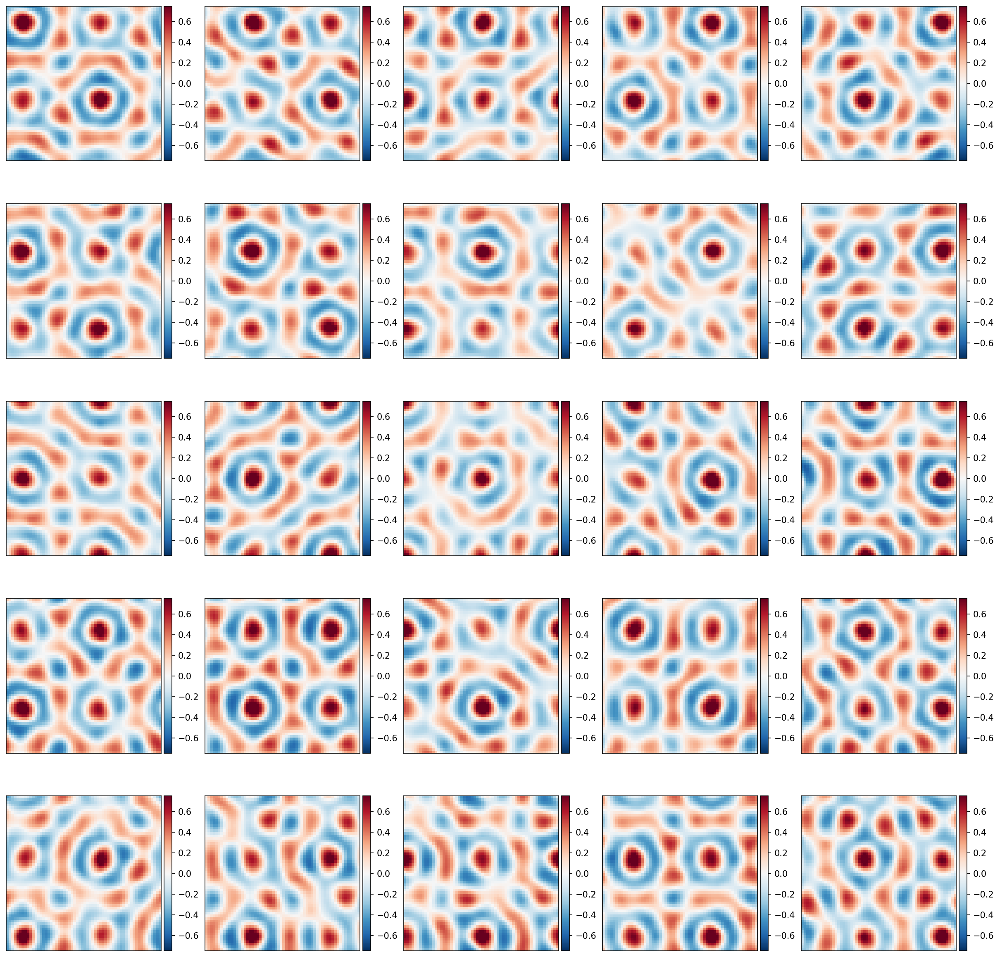

In [16]:
n_row = 5

fig,axs = plt.subplots(n_row,n_row,figsize=(n_row*4,n_row*4),dpi=150)

idxs = np.arange(N4//(2*n_row),N4,N4//n_row)
for i in range(n_row):
    for j in range(n_row):
        seed_idx = (idxs[i],idxs[j])
        corr_patt = rates_corr[seed_idx[0],seed_idx[1],:,:]
        pf.imshowbar(fig,axs[i,j],corr_patt,cmap='RdBu_r',vmin=-0.75,vmax=0.75)

In [17]:
loc_max = rates_corr[:,:,:,:] > np.roll(rates_corr[:,:,:,:],-1,2)
loc_max = np.logical_and(loc_max,rates_corr[:,:,:,:] > np.roll(rates_corr[:,:,:,:],1,2))
loc_max = np.logical_and(loc_max,rates_corr[:,:,:,:] > np.roll(rates_corr[:,:,:,:],-1,3))
loc_max = np.logical_and(loc_max,rates_corr[:,:,:,:] > np.roll(rates_corr[:,:,:,:],1,3))

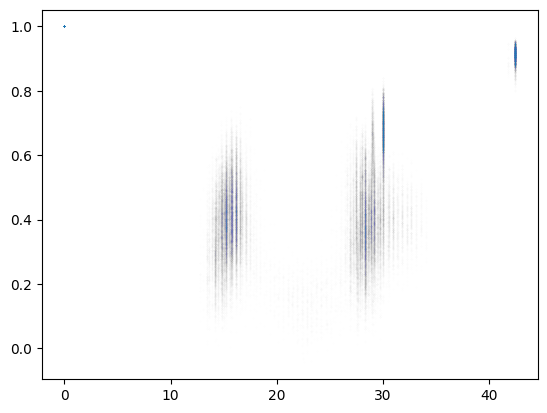

In [18]:
dxs,dys = np.meshgrid(np.arange(N4),np.arange(N4))
dxs = np.abs(dxs[:,:,None,None] - dxs[None,None,:,:])
dxs[dxs > N4//2] = N4 - dxs[dxs > N4//2]
dys = np.abs(dys[:,:,None,None] - dys[None,None,:,:])
dys[dys > N4//2] = N4 - dys[dys > N4//2]
dists = np.sqrt(dxs**2+dys**2)

plt.scatter(dists[loc_max],rates_corr[loc_max],s=0.1,alpha=0.01)

# Calculate dimensionality

In [19]:
rates_cov = rates_corr*np.std(rates[:,0],0)[:,:,None,None]*np.std(rates[:,0],0)[None,None,:,:]
rates_cov_mat = rates_cov.reshape((N4**2,N4**2))
w = np.linalg.eigvalsh(rates_cov_mat)

# print('Dimensionality =',np.trace(rates_cov_mat)**2/np.trace(rates_cov_mat@rates_cov_mat))
print('Dimensionality =',np.sum(w)**2/np.sum(w**2))

Dimensionality = 13.842714103083228


# Construct heterogeneous recurrent weights

In [20]:
config_name = "big_hetero"
# Version = -1
# config_dict,N4pop,Nlgnpop,Nret,Nlgn,N4,rA = uf.get_network_size(config_name,verbose=False)
    
# W4 = connectivity.Connectivity_2pop((N4,N4),(N4,N4),\
#                                     (N4,N4), (N4,N4),\
#                                     random_seed=config_dict["random_seed"],\
#                                     Nvert=1, verbose=True)

# start = time.process_time()

# Whtro,arbor4to4 = W4.create_matrix_2pop(config_dict["W4to4_params"],config_dict["W4to4_params"]["Wrec_mode"])

# print('Creating heterogeneous recurrent connectivity took',time.process_time() - start,'s')
# np.save('hetero_W4to4_N4={:d}'.format(N4),Whtro)

Whtro = np.load('hetero_W4to4_N4={:d}.npy'.format(N4))

Text(0.5, 1.0, 'L2/3 I Cell (Pre)')

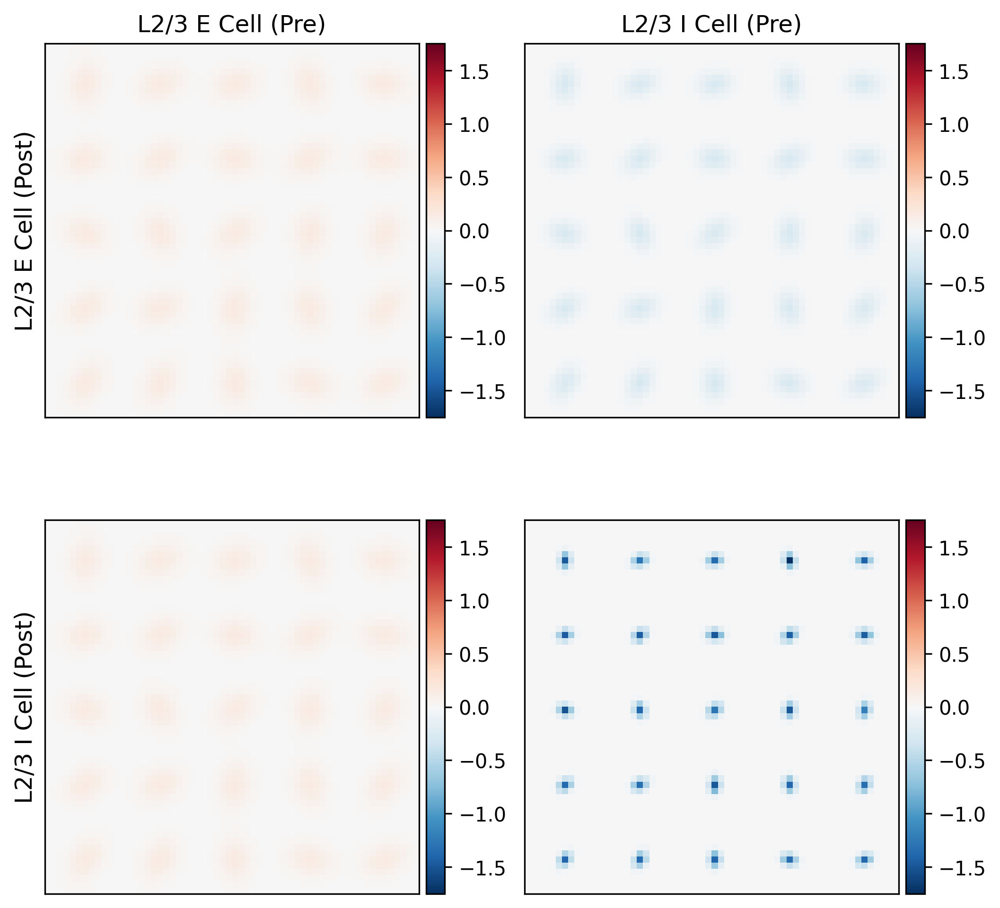

In [21]:
fig,axs = plt.subplots(2,2,figsize=(8,8),dpi=300)
fig.subplots_adjust(hspace=.2, wspace=.2)

WEE = np.zeros((N4,N4))
WEI = np.zeros((N4,N4))
WIE = np.zeros((N4,N4))
WII = np.zeros((N4,N4))

idxs = np.arange(N4//10,N4,N4//5)
for i in range(len(idxs)):
    for j in range(len(idxs)):
        rav_idx = np.ravel_multi_index([[idxs[i]],[idxs[j]]],(N4,N4))
        WEE += Whtro[:N4**2,:N4**2][:,rav_idx].reshape(N4,N4)
        WEI += Whtro[:N4**2,N4**2:][:,rav_idx].reshape(N4,N4)
        WIE += Whtro[N4**2:,:N4**2][:,rav_idx].reshape(N4,N4)
        WII += Whtro[N4**2:,N4**2:][:,rav_idx].reshape(N4,N4)

pf.imshowbar(fig,axs[0,0],WEE,
            vmin=-np.max(np.abs(Whtro)),vmax=np.max(np.abs(Whtro)),cmap='RdBu_r')
pf.imshowbar(fig,axs[0,1],WEI,
            vmin=-np.max(np.abs(Whtro)),vmax=np.max(np.abs(Whtro)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,0],WIE,
            vmin=-np.max(np.abs(Whtro)),vmax=np.max(np.abs(Whtro)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,1],WII,
            vmin=-np.max(np.abs(Whtro)),vmax=np.max(np.abs(Whtro)),cmap='RdBu_r')

axs[0,0].set_ylabel('L2/3 E Cell (Post)',fontsize=12)
axs[1,0].set_ylabel('L2/3 I Cell (Post)',fontsize=12)
axs[0,0].set_title('L2/3 E Cell (Pre)',fontsize=12)
axs[0,1].set_title('L2/3 I Cell (Pre)',fontsize=12)

# eigval,eigvec = sparse.linalg.eigs(Whtro,1,which='LR')
# print(eigval)

# Simulate network with bandpass filtered inputs

In [22]:
# rates = np.zeros((n_inp*n_cnd,2,N4,N4))

# start = time.process_time()

# for inp_idx in tqdm(range(n_inp)):
#         for cnd_idx in tqdm(range(n_cnd), leave=False):
#             idx = inp_idx*n_cnd+cnd_idx
#             rates[idx] = integrate(init_rates[idx].flatten(),inps[inp_idx].flatten(),1/3,2000,Whtro)
    
# print('Simulating rate dynamics took',time.process_time() - start,'s')
# np.save('hetero_rates_N4={:d}'.format(N4),rates.flatten())

rates = np.load('hetero_rates_N4={:d}.npy'.format(N4)).reshape((n_inp*n_cnd,2,N4,N4))

100%|██████████| 50/50 [2:01:56<00:00, 146.33s/it]

Simulating rate dynamics took 27870.364245000004 s


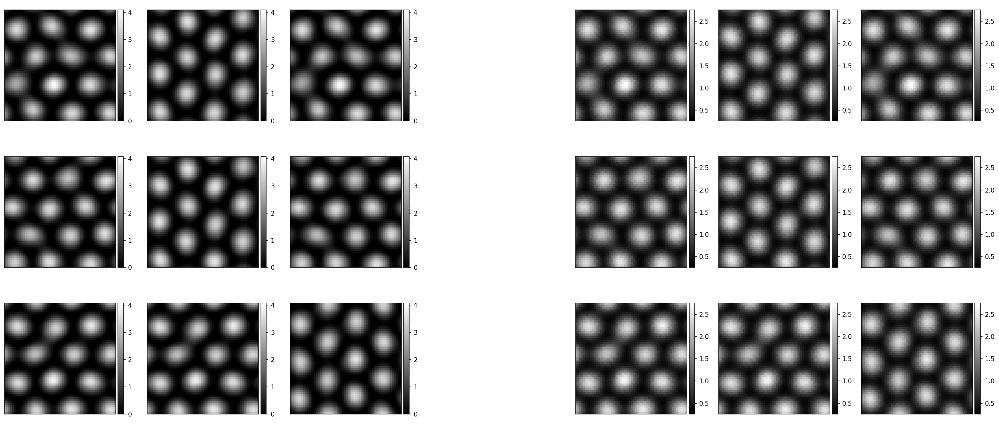

In [23]:
n_row = 3

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*4,n_row*4),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     rates[idx,0],cmap='binary_r',
                     vmin=np.min(rates[:,0]),vmax=np.max(rates[:,0]))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     rates[idx,1],cmap='binary_r',
                     vmin=np.min(rates[:,1]),vmax=np.max(rates[:,1]))

# Compare input power spectrum with rate power spectrum

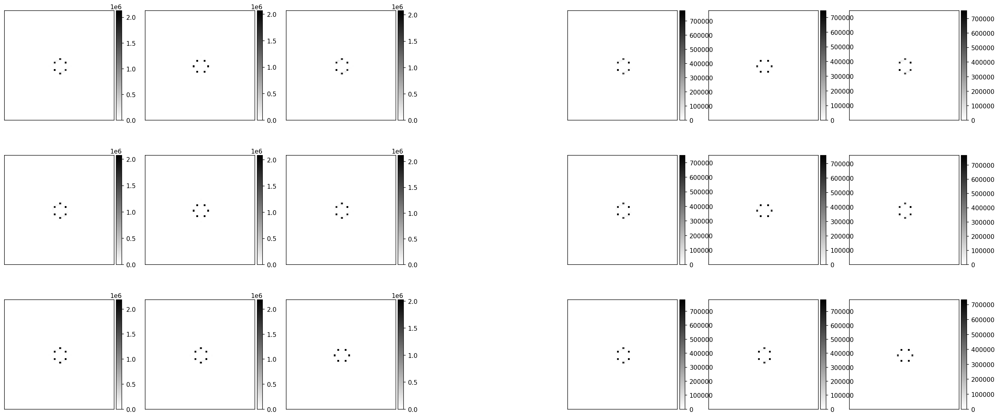

In [24]:
n_row = 3

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*4,n_row*4),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,0]-np.nanmean(rates[idx,0]))))**2,
                     cmap='binary')
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,1]-np.nanmean(rates[idx,1]))))**2,
                     cmap='binary')

In [25]:
# inp_fps_dat = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# inp_fps_err = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# rate_fps_dat = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
# rate_fps_err = np.zeros(int(np.ceil(N4//2*np.sqrt(2))))
inp_fps_dat = np.zeros(N4//2)
inp_fps_err = np.zeros(N4//2)
rate_fps_dat = np.zeros(N4//2)
rate_fps_err = np.zeros(N4//2)

grid = np.arange(-N4//2,N4//2)
x,y = np.meshgrid(grid,grid)
bin_idxs = np.digitize(np.sqrt(x**2+y**2),np.arange(0,np.ceil(N4//2*np.sqrt(2)))+0.1)

for idx in range(n_inp):
    fp2 = np.abs(np.fft.fftshift(np.fft.fft2(inps[idx,0]-np.nanmean(inps[idx,0]))))**2
    for bin_idx in range(N4//2):
        inp_fps_dat[bin_idx] += np.mean(fp2[bin_idxs == bin_idx])
        inp_fps_err[bin_idx] += np.var(fp2[bin_idxs == bin_idx])
        
    fp2 = np.abs(np.fft.fftshift(np.fft.fft2(inps[idx,1]-np.nanmean(inps[idx,1]))))**2
    for bin_idx in range(N4//2):
        inp_fps_dat[bin_idx] += np.mean(fp2[bin_idxs == bin_idx])
        inp_fps_err[bin_idx] += np.var(fp2[bin_idxs == bin_idx])
    
    fp2 = np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,0]-np.nanmean(rates[idx,0]))))**2
    for bin_idx in range(N4//2):
        rate_fps_dat[bin_idx] += np.mean(fp2[bin_idxs == bin_idx])
        rate_fps_err[bin_idx] += np.var(fp2[bin_idxs == bin_idx])
        
    fp2 = np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,1]-np.nanmean(rates[idx,1]))))**2
    for bin_idx in range(N4//2):
        rate_fps_dat[bin_idx] += np.mean(fp2[bin_idxs == bin_idx])
        rate_fps_err[bin_idx] += np.var(fp2[bin_idxs == bin_idx])

inp_fps_dat /= 2*n_inp
inp_fps_err /= 2*n_inp
inp_fps_err = np.sqrt(inp_fps_err / (2*n_inp))
rate_fps_dat /= 2*n_inp
rate_fps_err /= 2*n_inp
rate_fps_err = np.sqrt(rate_fps_err / (2*n_inp))

(0.0, 71.25137469934914)

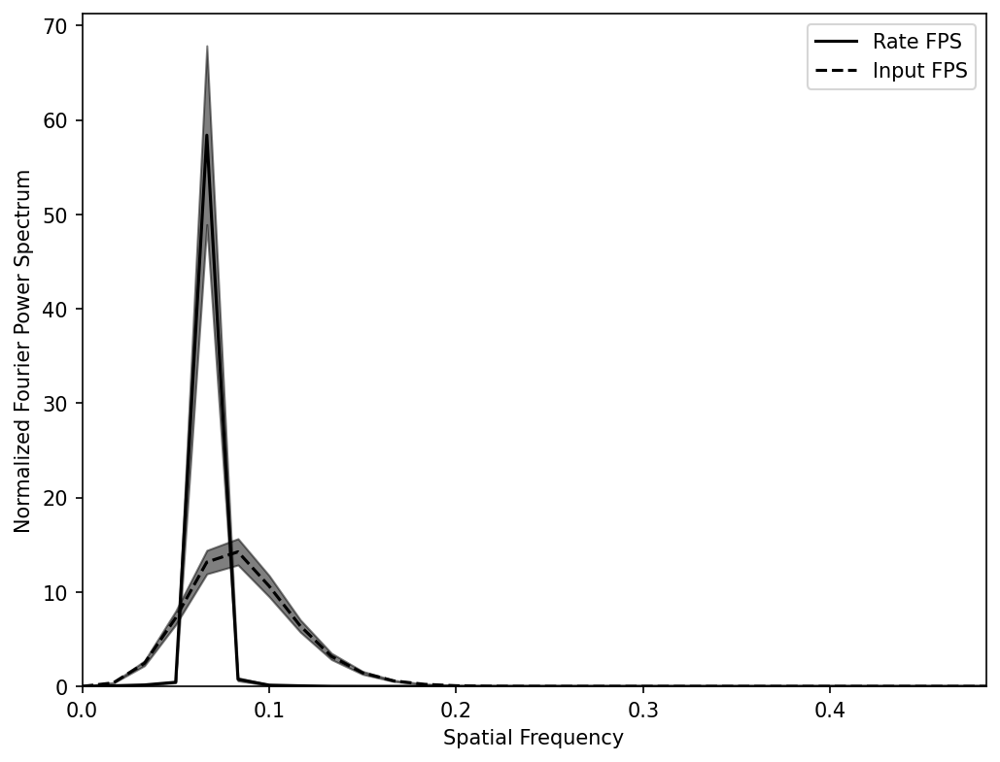

In [26]:
fig,axs = plt.subplots(1,1,figsize=(8,6),dpi=150)

freqs = np.arange(N4//2)/N4

axs.plot(freqs,rate_fps_dat/np.sum(rate_fps_dat)*N4,'k',label='Rate FPS')
axs.fill_between(freqs,(rate_fps_dat+rate_fps_err)/np.sum(rate_fps_dat)*N4,
                 (rate_fps_dat-rate_fps_err)/np.sum(rate_fps_dat)*N4,
                 color='k',alpha=0.5)
axs.plot(freqs,inp_fps_dat/np.sum(inp_fps_dat)*N4,'k--',label='Input FPS')
axs.fill_between(freqs,(inp_fps_dat+inp_fps_err)/np.sum(inp_fps_dat)*N4,
                 (inp_fps_dat-inp_fps_err)/np.sum(inp_fps_dat)*N4,
                 color='k',alpha=0.5)
axs.legend()

axs.set_xlabel('Spatial Frequency')
axs.set_ylabel('Normalized Fourier Power Spectrum')

axs.set_xlim(0,(N4//2-1)/N4)
axs.set_ylim(0,None)

In [27]:
print(1/freqs[np.argmax(rate_fps_dat)])

15.0


# Calculate correlation patterns

In [28]:
rates_zsc = rates[:,0] - np.mean(rates[:,0],0)
rates_zsc = rates_zsc / np.std(rates[:,0],0)

start = time.process_time()

# rates_cov = np.einsum('ijk,ilm->jklm',rates_sub,rates_sub) / n_inp
# rates_corr = rates_cov/(rates_std[:,:,None,None]*rates_std[None,None,:,:])
rates_corr = np.einsum('ijk,ilm->jklm',rates_zsc,rates_zsc) / (n_inp*n_cnd)

print('Calculating correlation patterns took',time.process_time() - start,'s')

Calculating correlation patterns took 1.1527029999997467 s


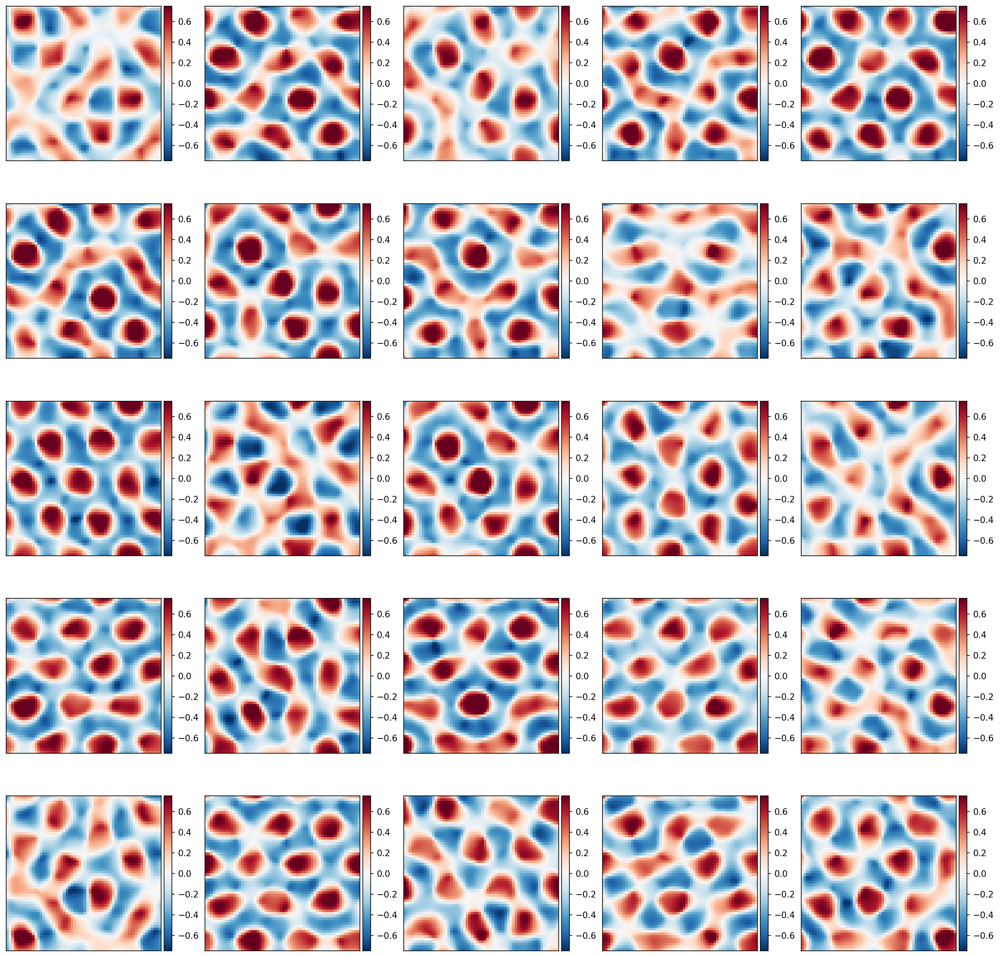

In [29]:
n_row = 5

fig,axs = plt.subplots(n_row,n_row,figsize=(n_row*4,n_row*4),dpi=150)

idxs = np.arange(N4//(2*n_row),N4,N4//n_row)
for i in range(n_row):
    for j in range(n_row):
        seed_idx = (idxs[i],idxs[j])
        corr_patt = rates_corr[seed_idx[0],seed_idx[1],:,:]
        pf.imshowbar(fig,axs[i,j],corr_patt,cmap='RdBu_r',vmin=-0.75,vmax=0.75)

In [30]:
loc_max = rates_corr[:,:,:,:] > np.roll(rates_corr[:,:,:,:],-1,2)
loc_max = np.logical_and(loc_max,rates_corr[:,:,:,:] > np.roll(rates_corr[:,:,:,:],1,2))
loc_max = np.logical_and(loc_max,rates_corr[:,:,:,:] > np.roll(rates_corr[:,:,:,:],-1,3))
loc_max = np.logical_and(loc_max,rates_corr[:,:,:,:] > np.roll(rates_corr[:,:,:,:],1,3))

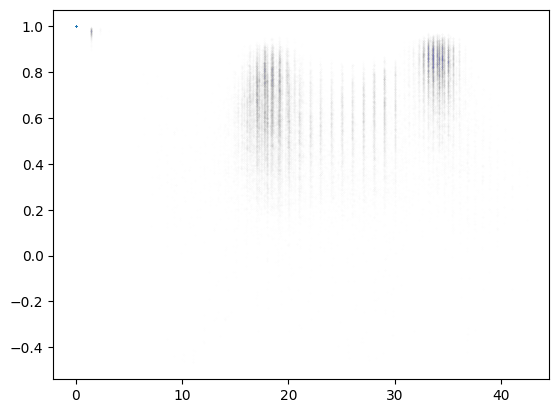

In [31]:
dxs,dys = np.meshgrid(np.arange(N4),np.arange(N4))
dxs = np.abs(dxs[:,:,None,None] - dxs[None,None,:,:])
dxs[dxs > N4//2] = N4 - dxs[dxs > N4//2]
dys = np.abs(dys[:,:,None,None] - dys[None,None,:,:])
dys[dys > N4//2] = N4 - dys[dys > N4//2]
dists = np.sqrt(dxs**2+dys**2)

plt.scatter(dists[loc_max],rates_corr[loc_max],s=0.1,alpha=0.01)

## Calculate dimensionality

In [32]:
rates_cov = rates_corr*np.std(rates[:,0],0)[:,:,None,None]*np.std(rates[:,0],0)[None,None,:,:]
rates_cov_mat = rates_cov.reshape((N4**2,N4**2))
w = np.linalg.eigvalsh(rates_cov_mat)

# print('Dimensionality =',np.trace(rates_cov_mat)**2/np.trace(rates_cov_mat@rates_cov_mat))
print('Dimensionality =',np.sum(w)**2/np.sum(w**2))

Dimensionality = 6.4746648187409175


# Construct smooth heterogeneous weights

In [33]:
config_name = "big_hetero_smooth"
# Version = -1
# config_dict,N4pop,Nlgnpop,Nret,Nlgn,N4,rA = uf.get_network_size(config_name,verbose=False)

# W4 = connectivity.Connectivity_2pop((N4,N4),(N4,N4),\
#                                     (N4,N4), (N4,N4),\
#                                     random_seed=config_dict["random_seed"],\
#                                     Nvert=1, verbose=True)

# start = time.process_time()

# Whtrs,arbor4to4 = W4.create_matrix_2pop(config_dict["W4to4_params"],config_dict["W4to4_params"]["Wrec_mode"])

# print('Creating smooth heterogeneous recurrent connectivity took',time.process_time() - start,'s')
# np.save('hetero_smooth_W4to4_N4={:d}'.format(N4),Whtrs)

Whtrs = np.load('hetero_smooth_W4to4_N4={:d}.npy'.format(N4))

Text(0.5, 1.0, 'L2/3 I Cell (Pre)')

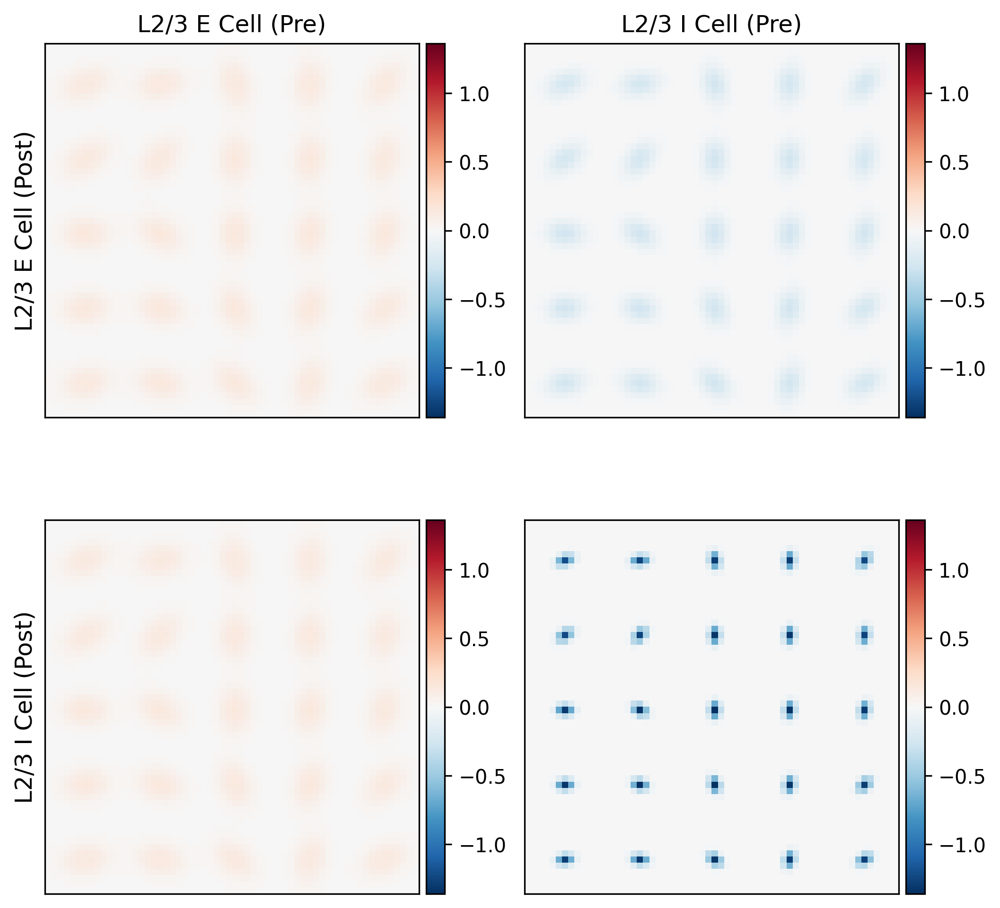

In [34]:
fig,axs = plt.subplots(2,2,figsize=(8,8),dpi=300)
fig.subplots_adjust(hspace=.2, wspace=.2)

WEE = np.zeros((N4,N4))
WEI = np.zeros((N4,N4))
WIE = np.zeros((N4,N4))
WII = np.zeros((N4,N4))

idxs = np.arange(N4//10,N4,N4//5)
for i in range(len(idxs)):
    for j in range(len(idxs)):
        rav_idx = np.ravel_multi_index([[idxs[i]],[idxs[j]]],(N4,N4))
        WEE += Whtrs[:N4**2,:N4**2][:,rav_idx].reshape(N4,N4)
        WEI += Whtrs[:N4**2,N4**2:][:,rav_idx].reshape(N4,N4)
        WIE += Whtrs[N4**2:,:N4**2][:,rav_idx].reshape(N4,N4)
        WII += Whtrs[N4**2:,N4**2:][:,rav_idx].reshape(N4,N4)

pf.imshowbar(fig,axs[0,0],WEE,
            vmin=-np.max(np.abs(Whtrs)),vmax=np.max(np.abs(Whtrs)),cmap='RdBu_r')
pf.imshowbar(fig,axs[0,1],WEI,
            vmin=-np.max(np.abs(Whtrs)),vmax=np.max(np.abs(Whtrs)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,0],WIE,
            vmin=-np.max(np.abs(Whtrs)),vmax=np.max(np.abs(Whtrs)),cmap='RdBu_r')
pf.imshowbar(fig,axs[1,1],WII,
            vmin=-np.max(np.abs(Whtrs)),vmax=np.max(np.abs(Whtrs)),cmap='RdBu_r')

axs[0,0].set_ylabel('L2/3 E Cell (Post)',fontsize=12)
axs[1,0].set_ylabel('L2/3 I Cell (Post)',fontsize=12)
axs[0,0].set_title('L2/3 E Cell (Pre)',fontsize=12)
axs[0,1].set_title('L2/3 I Cell (Pre)',fontsize=12)

# eigval,eigvec = sparse.linalg.eigs(Whtrs,1,which='LR')
# print(eigval)

# Simulate network with bandpass filtered inputs

In [36]:
# rates = np.zeros((n_inp*n_cnd,2,N4,N4))

# start = time.process_time()

# for inp_idx in tqdm(range(n_inp)):
#         for cnd_idx in tqdm(range(n_cnd), leave=False):
#             idx = inp_idx*n_cnd+cnd_idx
#             rates[idx] = integrate(init_rates[idx].flatten(),inps[inp_idx].flatten(),1/3,2000,Whtrs)
    
# print('Simulating rate dynamics took',time.process_time() - start,'s')
# np.save('hetero_smooth_rates_N4={:d}'.format(N4),rates.flatten())

rates = np.load('hetero_smooth_rates_N4={:d}.npy'.format(N4)).reshape((n_inp*n_cnd,2,N4,N4))

100%|██████████| 50/50 [2:01:23<00:00, 145.68s/it]


Simulating rate dynamics took 27054.968374999997 s


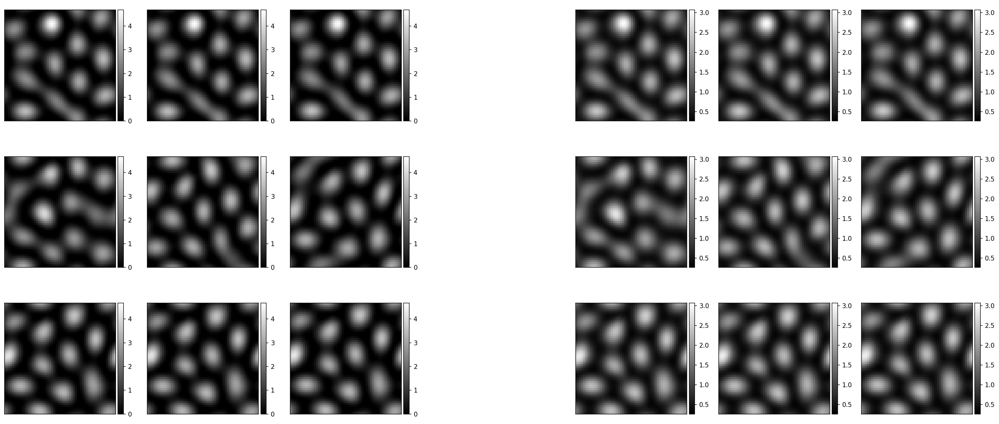

In [37]:
n_row = 3

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*4,n_row*4),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     rates[idx,0],cmap='binary_r',
                     vmin=np.min(rates[:,0]),vmax=np.max(rates[:,0]))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     rates[idx,1],cmap='binary_r',
                     vmin=np.min(rates[:,1]),vmax=np.max(rates[:,1]))

# Calculate typical length scale

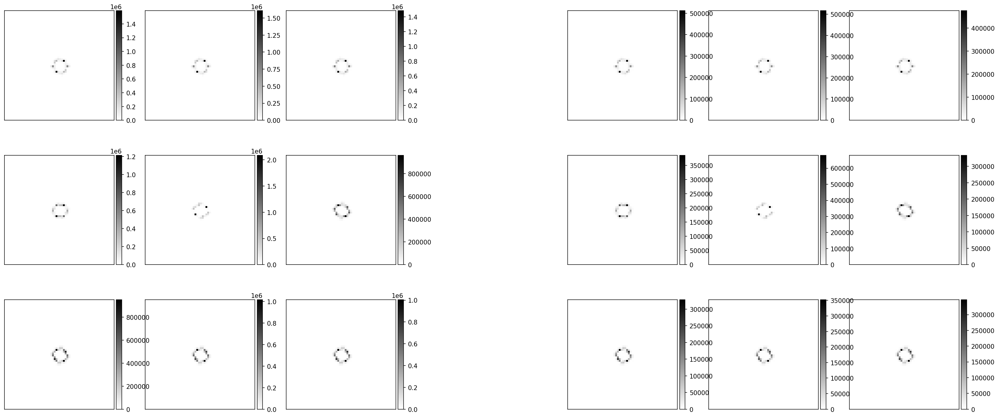

In [38]:
n_row = 3

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*4,n_row*4),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,0]-np.nanmean(rates[idx,0]))))**2,
                     cmap='binary')
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     np.abs(np.fft.fftshift(np.fft.fft2(rates[idx,1]-np.nanmean(rates[idx,1]))))**2,
                     cmap='binary')

# Calculate correlation patterns

In [39]:
rates_zsc = rates[:,0] - np.mean(rates[:,0],0)
rates_zsc = rates_zsc / np.std(rates[:,0],0)

start = time.process_time()

# rates_cov = np.einsum('ijk,ilm->jklm',rates_sub,rates_sub) / n_inp
# rates_corr = rates_cov/(rates_std[:,:,None,None]*rates_std[None,None,:,:])
rates_corr = np.einsum('ijk,ilm->jklm',rates_zsc,rates_zsc) / (n_inp*n_cnd)

print('Calculating correlation patterns took',time.process_time() - start,'s')

Calculating correlation patterns took 1.9106430000101682 s


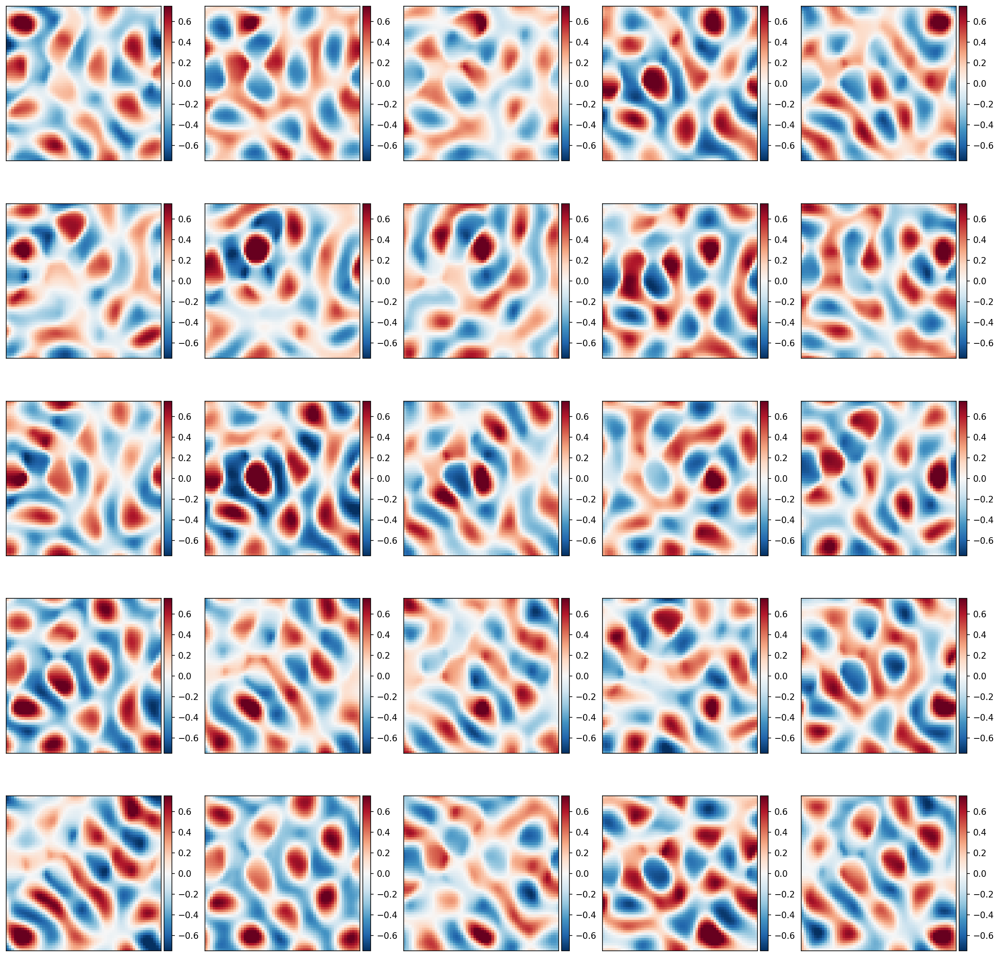

In [40]:
n_row = 5

fig,axs = plt.subplots(n_row,n_row,figsize=(n_row*4,n_row*4),dpi=150)

idxs = np.arange(N4//(2*n_row),N4,N4//n_row)
for i in range(n_row):
    for j in range(n_row):
        seed_idx = (idxs[i],idxs[j])
        corr_patt = rates_corr[seed_idx[0],seed_idx[1],:,:]
        pf.imshowbar(fig,axs[i,j],corr_patt,cmap='RdBu_r',vmin=-0.75,vmax=0.75)

In [41]:
rates_cov = rates_corr*np.std(rates[:,0],0)[:,:,None,None]*np.std(rates[:,0],0)[None,None,:,:]
rates_cov_mat = rates_cov.reshape((N4**2,N4**2))
w = np.linalg.eigvalsh(rates_cov_mat)

# print('Dimensionality =',np.trace(rates_cov_mat)**2/np.trace(rates_cov_mat@rates_cov_mat))
print('Dimensionality =',np.sum(w)**2/np.sum(w**2))

Dimensionality = 8.43028562612164


# Compare activity patterns after long integration times

In [78]:
homo_rate = integrate(init_rates[0].flatten(),inps[0].flatten(),1/3,6000,Whomo)
htro_rate = integrate(init_rates[0].flatten(),inps[0].flatten(),1/3,6000,Whtro)
htrs_rate = integrate(init_rates[0].flatten(),inps[0].flatten(),1/3,6000,Whtrs)

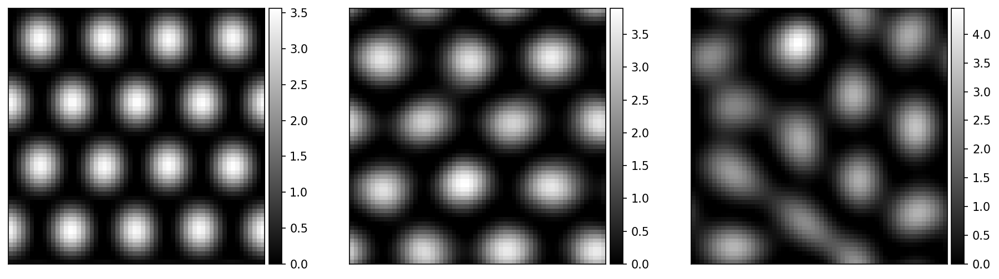

In [80]:
fig,axs = plt.subplots(1,3,figsize=(3*5,1*4),dpi=150)

pf.imshowbar(fig,axs[0],homo_rate.reshape((2,N4,N4))[0],cmap='binary_r')
pf.imshowbar(fig,axs[1],htro_rate.reshape((2,N4,N4))[0],cmap='binary_r')
pf.imshowbar(fig,axs[2],htrs_rate.reshape((2,N4,N4))[0],cmap='binary_r')

# Calculate Fracture Lines

In [65]:
C_zsc = rates_corr - np.mean(rates_corr,(2,3))[:,:,None,None]
C_zsc = C_zsc / np.std(rates_corr,(2,3))[:,:,None,None]

C_px = np.roll(C_zsc,-1,0)
C_mx = np.roll(C_zsc, 1,0)
C_py = np.roll(C_zsc,-1,1)
C_my = np.roll(C_zsc, 1,1)

start = time.process_time()

# C_corr_x = np.einsum('ijab,ijab->ij',C_px,C_mx) / (N4**2)
# C_corr_y = np.einsum('ijab,ijab->ij',C_py,C_my) / (N4**2)
C_corr_x = np.einsum('ijab,ijab->ij',C_px,C_zsc) / (N4**2)
C_corr_y = np.einsum('ijab,ijab->ij',C_py,C_zsc) / (N4**2)

print('Calculating correlation difference patterns took',time.process_time() - start,'s')

Calculating correlation difference patterns took 0.028246000001672655 s


In [44]:
from skimage.morphology import medial_axis,skeletonize

In [66]:
# F_x = (1-C_corr_x) / 2
# F_y = (1-C_corr_y) / 2
F_x = (1-C_corr_x) / 1
F_y = (1-C_corr_y) / 1

rates_frac = np.sqrt(F_x**2 + F_y**2)
frac_min = np.min(rates_frac)
frac_max = np.max(rates_frac)

def normalize(A):
    return (A-np.min(A))/(np.max(A)-np.min(A))

def integize(A,bits=16):
    if bits == 8:
        return (normalize(A)*255).astype(np.uint8)
    else:
        return (normalize(A)*65535).astype(np.uint16)

def wrap_pad(A,pad_len=1):
    old_shape = np.array(A.shape)
    new_shape = (old_shape + 2*pad_len*np.ones(2)).astype(int)
    new_A = np.zeros(new_shape,A.dtype)
    new_A[pad_len:-pad_len,pad_len:-pad_len] = A.copy()
    new_A[ :pad_len,pad_len:-pad_len] = A[-pad_len:,:].copy()
    new_A[-pad_len:,pad_len:-pad_len] = A[ :pad_len,:].copy()
    new_A[pad_len:-pad_len, :pad_len] = A[:,-pad_len:].copy()
    new_A[pad_len:-pad_len,-pad_len:] = A[:, :pad_len].copy()
    new_A[ :pad_len, :pad_len] = A[-pad_len:,-pad_len:].copy()
    new_A[-pad_len:, :pad_len] = A[ :pad_len,-pad_len:].copy()
    new_A[ :pad_len,-pad_len:] = A[-pad_len:, :pad_len].copy()
    new_A[-pad_len:,-pad_len:] = A[ :pad_len, :pad_len].copy()
    return new_A

def wrap_unpad(A,pad_len=1):
    return A[pad_len:-pad_len,pad_len:-pad_len].copy()

clahe = cv2.createCLAHE(clipLimit=20, tileGridSize=(10,10))
struct = np.ones((2,2))
# for i in [0,-1]:
#     for j in [0,-1]:
#         struct[i,j] = 0
struct = struct.astype(np.uint8)

rates_frac_int = integize(rates_frac)
rates_frac_medfilt = integize(ndimage.median_filter(rates_frac_int,3,mode='wrap'))
rates_frac_clahe = integize(wrap_unpad(clahe.apply(wrap_pad(rates_frac_medfilt,8)),8))
rates_frac_bin = (rates_frac_clahe > 65535/2).astype(np.uint8)
rates_frac_erodil = rates_frac_bin.copy()

for i in range(2):
    rates_frac_erodil = wrap_unpad(cv2.erode(wrap_pad(rates_frac_erodil,8),struct),8)
    rates_frac_erodil = wrap_unpad(cv2.dilate(wrap_pad(rates_frac_erodil,8),struct),8)
    
rates_frac_skel = wrap_unpad(skeletonize(wrap_pad(rates_frac_erodil,8)),8).astype(np.uint8)
# rates_frac_skel,rates_frac_dists = medial_axis(wrap_pad(rates_frac_erodil,8),return_distance=True)
# rates_frac_skel = wrap_unpad(rates_frac_skel,8).astype(np.uint8)

Text(0.5, 1.0, 'Skeletonized Fracture Strength')

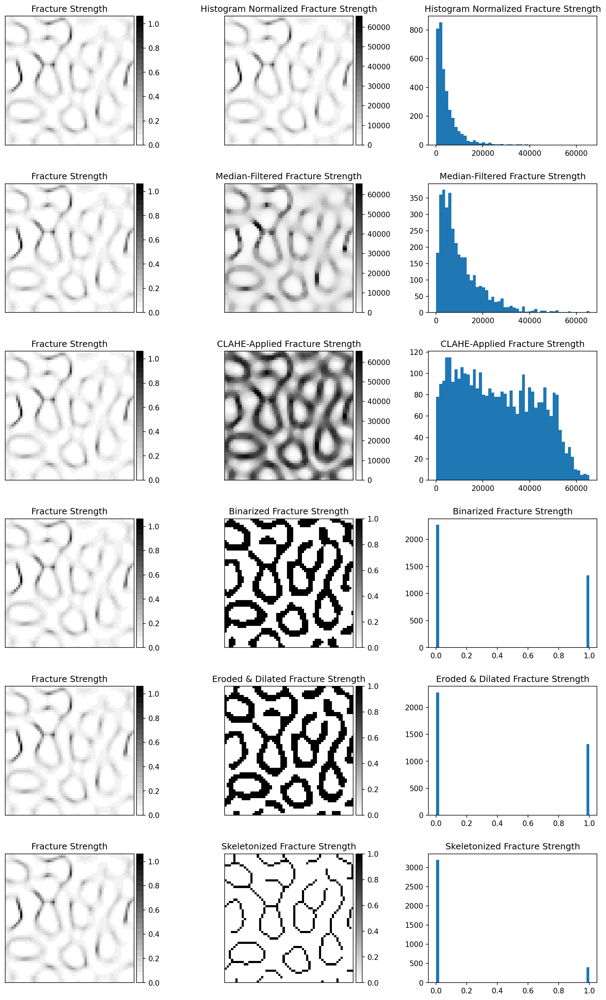

In [67]:
fig,axs = plt.subplots(6,3,figsize=(15,24),dpi=150)
fig.subplots_adjust(hspace=.3, wspace=.3)

bin_cmap = plt.get_cmap('binary', 24)
bin_cmap._init()
# bin_cmap._lut[:,-1] = np.concatenate((np.fmin(1.0,np.fmax(0.0,
#                             np.linspace(-1.0, 1.5, bin_cmap.N))),np.ones(3)))

pf.imshowbar(fig,axs[0,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[0,1],rates_frac_int,cmap=bin_cmap,vmin=0)
axs[0,2].hist((rates_frac_int).flatten(),50)

pf.imshowbar(fig,axs[1,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[1,1],rates_frac_medfilt,cmap='binary',vmin=0)
axs[1,2].hist((rates_frac_medfilt).flatten(),50)

pf.imshowbar(fig,axs[2,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[2,1],rates_frac_clahe,cmap='binary',vmin=0)
axs[2,2].hist((rates_frac_clahe).flatten(),50)

pf.imshowbar(fig,axs[3,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[3,1],rates_frac_bin,cmap='binary',vmin=0)
axs[3,2].hist((rates_frac_bin).flatten(),50)

pf.imshowbar(fig,axs[4,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[4,1],rates_frac_erodil,cmap='binary',vmin=0)
axs[4,2].hist((rates_frac_erodil).flatten(),50)

pf.imshowbar(fig,axs[5,0],rates_frac,cmap=bin_cmap,vmin=0)
pf.imshowbar(fig,axs[5,1],rates_frac_skel,cmap='binary',vmin=0)
axs[5,2].hist((rates_frac_skel).flatten(),50)

axs[0,0].set_title('Fracture Strength'.format(i+1))
axs[0,1].set_title('Histogram Normalized Fracture Strength'.format(i+1))
axs[0,2].set_title('Histogram Normalized Fracture Strength'.format(i+1))

axs[1,0].set_title('Fracture Strength'.format(i+1))
axs[1,1].set_title('Median-Filtered Fracture Strength'.format(i+1))
axs[1,2].set_title('Median-Filtered Fracture Strength'.format(i+1))

axs[2,0].set_title('Fracture Strength'.format(i+1))
axs[2,1].set_title('CLAHE-Applied Fracture Strength'.format(i+1))
axs[2,2].set_title('CLAHE-Applied Fracture Strength'.format(i+1))

axs[3,0].set_title('Fracture Strength'.format(i+1))
axs[3,1].set_title('Binarized Fracture Strength'.format(i+1))
axs[3,2].set_title('Binarized Fracture Strength'.format(i+1))

axs[4,0].set_title('Fracture Strength'.format(i+1))
axs[4,1].set_title('Eroded & Dilated Fracture Strength'.format(i+1))
axs[4,2].set_title('Eroded & Dilated Fracture Strength'.format(i+1))

axs[5,0].set_title('Fracture Strength'.format(i+1))
axs[5,1].set_title('Skeletonized Fracture Strength'.format(i+1))
axs[5,2].set_title('Skeletonized Fracture Strength'.format(i+1))

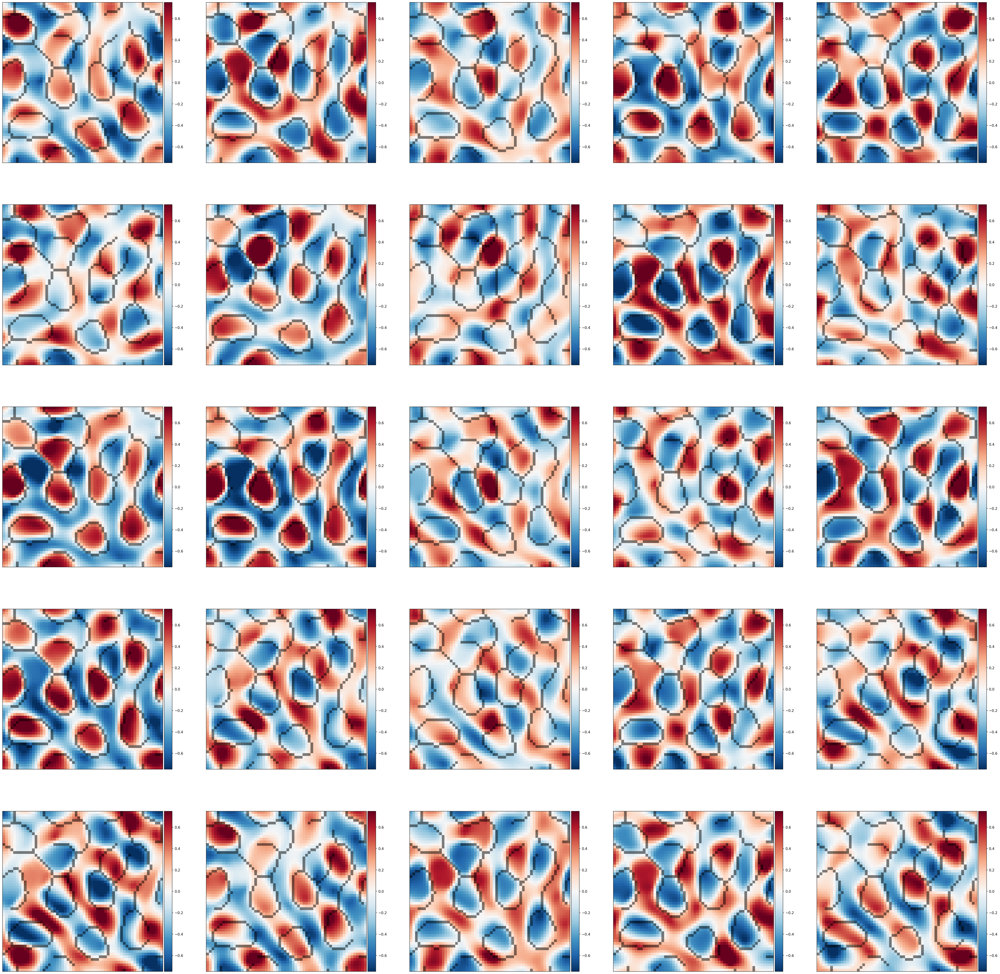

In [68]:
n_row = 5

fig,axs = plt.subplots(n_row,n_row,figsize=(n_row*4,n_row*4),dpi=150)

bin_cmap = plt.get_cmap('binary', 24)
bin_cmap._init()
bin_cmap._lut[:,-1] = np.concatenate((np.fmin(1.0,np.fmax(0.0,np.linspace(-1.0, 1.5, bin_cmap.N))),np.ones(3)))

idxs = np.arange(N4//(2*n_row),N4,N4//n_row)
for i in range(n_row):
    for j in range(n_row):
        seed_idx = (idxs[i],idxs[j])
        pf.imshowbar(fig,axs[i,j],rates_corr[seed_idx[0],seed_idx[1],:,:],cmap='RdBu_r',vmin=-0.75,vmax=0.75)
        axs[i,j].imshow(rates_frac_skel,cmap=bin_cmap,vmin=0,alpha=0.5)

# Investigate amplified directions

In [ ]:
start = time.process_time()

chi_homo = np.linalg.inv(np.eye(2*N4**2)-1.02*Whomo)
chi_htro = np.linalg.inv(np.eye(2*N4**2)-1.02*Whtro)

print('Calculating input-output matrices took',time.process_time() - start,'s')

Calculating input-output matrices took 87.70257100000163 s


In [ ]:
start = time.process_time()

U_homo,S_homo,Vh_homo = np.linalg.svd(chi_homo)
U_htro,S_htro,Vh_htro = np.linalg.svd(chi_htro)

print('Calculating singular value decomps took',time.process_time() - start,'s')

Calculating singular value decomps took 1173.2698799999998 s


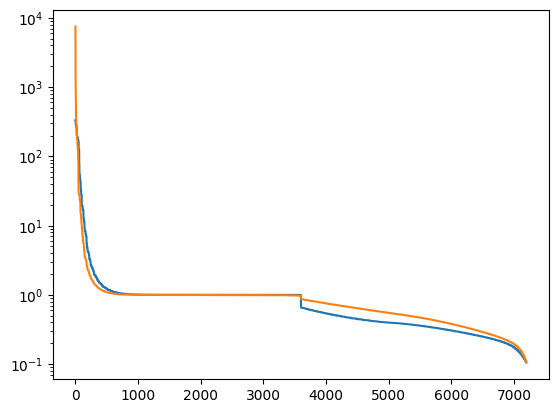

In [ ]:
plt.plot(S_homo)
plt.plot(S_htro)
plt.yscale('log')

## Plot right singular vectors (input patterns)

In [ ]:
n_row = 3

fig,axs = plt.subplots(2*n_row+1,2*n_row+1,figsize=((2*n_row+1)*4,(2*n_row+1)*4),dpi=150)

axs[n_row,n_row].axis('off')

for i in range(n_row):
    axs[i,n_row].axis('off')
    axs[n_row+i+1,n_row].axis('off')
    axs[n_row,i].axis('off')
    axs[n_row,n_row+i+1].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        v_homo = Vh_homo[idx,:].reshape((2,N4,N4))
        v_htro = Vh_htro[idx,:].reshape((2,N4,N4))
        pf.imshowbar(fig,axs[i,j],
                     v_homo[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_homo[0])),vmax=np.max(np.abs(v_homo[0])))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     v_homo[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_homo[1])),vmax=np.max(np.abs(v_homo[1])))
        pf.imshowbar(fig,axs[n_row+i+1,j],
                     v_htro[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_htro[0])),vmax=np.max(np.abs(v_htro[0])))
        pf.imshowbar(fig,axs[n_row+i+1,n_row+j+1],
                     v_htro[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_htro[1])),vmax=np.max(np.abs(v_htro[1])))

In [ ]:
n_row = 3

fig,axs = plt.subplots(2*n_row+1,2*n_row+1,figsize=((2*n_row+1)*4,(2*n_row+1)*4),dpi=150)

axs[n_row,n_row].axis('off')

for i in range(n_row):
    axs[i,n_row].axis('off')
    axs[n_row+i+1,n_row].axis('off')
    axs[n_row,i].axis('off')
    axs[n_row,n_row+i+1].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        v_homo = Vh_homo[-8-idx,:].reshape((2,N4,N4))
        v_htro = Vh_htro[-8-idx,:].reshape((2,N4,N4))
        pf.imshowbar(fig,axs[i,j],
                     v_homo[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_homo[0])),vmax=np.max(np.abs(v_homo[0])))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     v_homo[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_homo[1])),vmax=np.max(np.abs(v_homo[1])))
        pf.imshowbar(fig,axs[n_row+i+1,j],
                     v_htro[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_htro[0])),vmax=np.max(np.abs(v_htro[0])))
        pf.imshowbar(fig,axs[n_row+i+1,n_row+j+1],
                     v_htro[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(v_htro[1])),vmax=np.max(np.abs(v_htro[1])))

## Plot left singular vectors (output patterns)

In [ ]:
n_row = 3

fig,axs = plt.subplots(2*n_row+1,2*n_row+1,figsize=((2*n_row+1)*4,(2*n_row+1)*4),dpi=150)

axs[n_row,n_row].axis('off')

for i in range(n_row):
    axs[i,n_row].axis('off')
    axs[n_row+i+1,n_row].axis('off')
    axs[n_row,i].axis('off')
    axs[n_row,n_row+i+1].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        u_homo = U_homo[:,idx].reshape((2,N4,N4))
        u_htro = U_htro[:,idx].reshape((2,N4,N4))
        pf.imshowbar(fig,axs[i,j],
                     u_homo[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_homo[0])),vmax=np.max(np.abs(u_homo[0])))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     u_homo[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_homo[1])),vmax=np.max(np.abs(u_homo[1])))
        pf.imshowbar(fig,axs[n_row+i+1,j],
                     u_htro[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_htro[0])),vmax=np.max(np.abs(u_htro[0])))
        pf.imshowbar(fig,axs[n_row+i+1,n_row+j+1],
                     u_htro[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_htro[1])),vmax=np.max(np.abs(u_htro[1])))

In [ ]:
n_row = 3

fig,axs = plt.subplots(2*n_row+1,2*n_row+1,figsize=((2*n_row+1)*4,(2*n_row+1)*4),dpi=150)

axs[n_row,n_row].axis('off')

for i in range(n_row):
    axs[i,n_row].axis('off')
    axs[n_row+i+1,n_row].axis('off')
    axs[n_row,i].axis('off')
    axs[n_row,n_row+i+1].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        u_homo = U_homo[:,-8-idx].reshape((2,N4,N4))
        u_htro = U_htro[:,-8-idx].reshape((2,N4,N4))
        pf.imshowbar(fig,axs[i,j],
                     u_homo[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_homo[0])),vmax=np.max(np.abs(u_homo[0])))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     u_homo[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_homo[1])),vmax=np.max(np.abs(u_homo[1])))
        pf.imshowbar(fig,axs[n_row+i+1,j],
                     u_htro[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_htro[0])),vmax=np.max(np.abs(u_htro[0])))
        pf.imshowbar(fig,axs[n_row+i+1,n_row+j+1],
                     u_htro[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(u_htro[1])),vmax=np.max(np.abs(u_htro[1])))

## Compare to PC's of activity

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=50)
pca.fit(rates.reshape((-1,2*N4**2)))
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.06123346 0.0555926  0.0527395  0.04767308 0.04544728 0.04348766
 0.04047136 0.03877072 0.03532302 0.03331894 0.03148325 0.03048109
 0.02813803 0.02570892 0.02449344 0.02411716 0.02273014 0.02069267
 0.02008676 0.01982635 0.0187873  0.01727091 0.01640241 0.01465589
 0.01448257 0.01426306 0.01413809 0.01291318 0.01167477 0.01120719
 0.01097776 0.01023342 0.00964772 0.00908719 0.00862155 0.00772099
 0.0074674  0.00694893 0.00659058 0.00651345 0.0055263  0.00515483
 0.00465215 0.00451982 0.00374155 0.00335362 0.00307039 0.00286082
 0.00278075 0.00253505]
[4.77660917 4.55128255 4.4329551  4.21465387 4.11508942 4.02539362
 3.88328461 3.80081959 3.62789076 3.52347255 3.42503567 3.37008263
 3.23796511 3.09504708 3.02099645 2.99770133 2.91022352 2.77672932
 2.73577415 2.71798273 2.64580269 2.53678084 2.47217487 2.33685316
 2.32299454 2.30532208 2.29520067 2.19352122 2.0856891  2.04349588
 2.02247002 1.95270058 1.89599741 1.84009462 1.79233057 1.69614016
 1.66805347 1.60910418 1.56706598 1.55

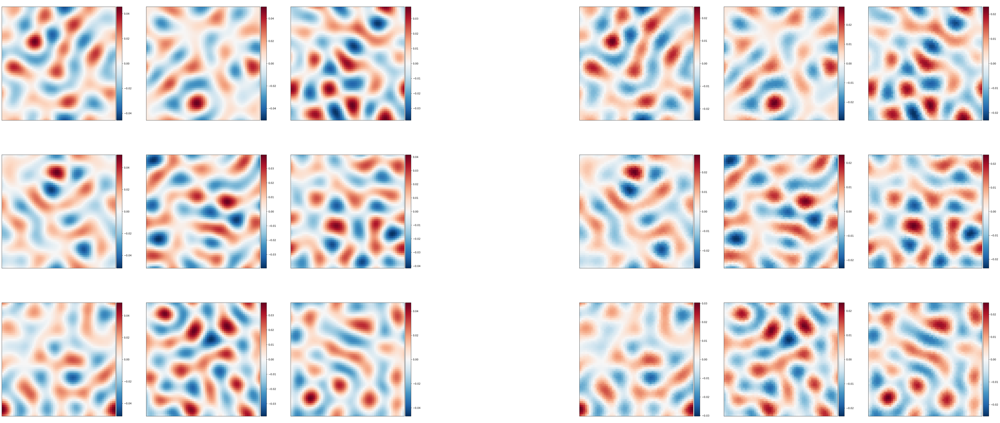

In [ ]:
n_row = 3

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*4,n_row*4),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pc = pca.components_[idx].reshape((2,N4,N4))
        pf.imshowbar(fig,axs[i,j],
                     pc[0],cmap='RdBu_r',
                     vmin=-np.max(np.abs(pc[0])),vmax=np.max(np.abs(pc[0])))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     pc[1],cmap='RdBu_r',
                     vmin=-np.max(np.abs(pc[1])),vmax=np.max(np.abs(pc[1])))

Text(0, 0.5, 'Normalized Singular Values')

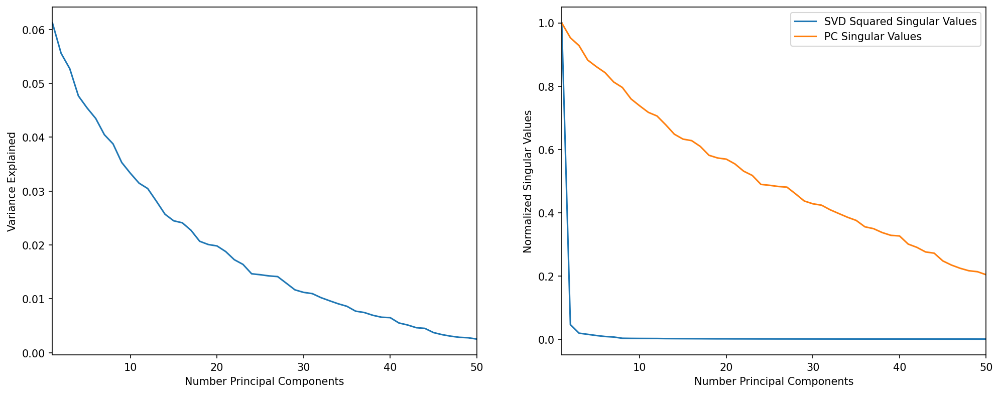

In [ ]:
fig,axs = plt.subplots(1,2,figsize=(16,6),dpi=150)

axs[0].plot(np.arange(1,pca.n_components_+1),pca.explained_variance_ratio_)
axs[0].set_xlim(1,pca.n_components_)
# axs[0].set_yscale('log')
axs[0].set_xlabel('Number Principal Components')
axs[0].set_ylabel('Variance Explained')

axs[1].plot(np.arange(1,pca.n_components_+1),(S_htro**2)[:pca.n_components_]/((S_htro**2)[0]),
           label='SVD Squared Singular Values')
axs[1].plot(np.arange(1,pca.n_components_+1),pca.singular_values_[:pca.n_components_]/pca.singular_values_[0],
           label='PC Singular Values')
axs[1].legend()
axs[1].set_xlim(1,pca.n_components_)
axs[1].set_xlabel('Number Principal Components')
axs[1].set_ylabel('Normalized Singular Values')

# Read simulated results

In [ ]:
test = []

for a in range(2):
    this_test = []
    for b in range(3):
        this_test.append(3*a+b)
    test.append(this_test)
        
test = np.array(test)

In [ ]:
test

array([[0, 1, 2],
       [3, 4, 5]])

In [ ]:
grecs = 1.02*np.linspace(0.95,1.05,5)
betxs = np.linspace(0.5,1.5,5)

sim_rates = []
sim_rates_ssn = []

for grec_idx,grec in enumerate(grecs):
    with open('./../results/L23_corr_relu_H={:.1f}_eta={:.0e}_grec={:.3f}/seed={:d}.pkl'.format(
            0.7,1e-2,float('{:.4f}'.format(grec)),0), 'rb') as handle:
        res_dict = pickle.load(handle)
    sim_rates.append(res_dict['rates'])
    
    this_sim_rates_ssn = []
    for betx_idx,betx in enumerate(betxs):
        with open('./../results/L23_corr_ssn_H={:.1f}_eta={:.0e}_grec={:.3f}_betx={:.2f}/seed={:d}.pkl'.format(
                0.7,1e-2,float('{:.4f}'.format(grec)),betx,0), 'rb') as handle:
            res_dict = pickle.load(handle)
        this_sim_rates_ssn.append(res_dict['rates'])
    sim_rates_ssn.append(this_sim_rates_ssn)

sim_rates = np.array(sim_rates)
sim_rates_ssn = np.array(sim_rates_ssn)

In [ ]:
sim_rates_mean = np.mean(sim_rates,1)
sim_rates_sub = sim_rates - sim_rates_mean[:,None,...]
sim_rates_zsc = sim_rates_sub / np.std(sim_rates,1)[:,None,...]

sim_rates_ssn_mean = np.mean(sim_rates_ssn,2)
sim_rates_ssn_sub = sim_rates_ssn - sim_rates_ssn_mean[:,:,None,...]
sim_rates_ssn_zsc = sim_rates_ssn_sub / np.std(sim_rates_ssn,2)[:,:,None,...]

In [ ]:
np.mean(sim_rates_ssn[:,:,:,0],(2,3,4)) < 3

array([[ True,  True,  True,  True,  True],
       [ True,  True,  True,  True, False],
       [ True,  True,  True,  True, False],
       [ True,  True,  True, False, False],
       [ True, False, False, False, False]])

In [ ]:
sim_dims = np.zeros(len(grecs))
sim_dims_ssn = np.zeros((len(grecs),len(betxs)))

for grec_idx in range(len(grecs)):
    this_rates = sim_rates[grec_idx]
    this_rates_sub = (this_rates[:,0] - np.mean(this_rates[:,0],0)).reshape((-1,N4**2))
    this_ws = np.linalg.svd(this_rates_sub,compute_uv=False)
    this_ws = this_ws**2
    sim_dims[grec_idx] = np.sum(this_ws)**2/np.sum(this_ws**2)
    
    for betx_idx in range(len(betxs)):
        this_rates = sim_rates_ssn[grec_idx,betx_idx]
        this_rates_sub = (this_rates[:,0] - np.mean(this_rates[:,0],0)).reshape((-1,N4**2))
        this_ws = np.linalg.svd(this_rates_sub,compute_uv=False)
        this_ws = this_ws**2
        sim_dims_ssn[grec_idx,betx_idx] = np.sum(this_ws)**2/np.sum(this_ws**2)

In [ ]:
print(sim_dims)
print(sim_dims_ssn)

[37.41528987 29.33707041 22.7611666  19.02220192 20.35894605]
[[37.51597975 37.48623795 37.42431292 37.32331179 36.55748145]
 [29.29673884 29.33245749 29.35788767 29.35562892  1.53637948]
 [22.714075   22.78682487 22.88727651 23.14752511  1.00180603]
 [19.03204478 19.22693729 19.71402086  1.43729872  1.00084085]
 [17.43746851  1.          6.35295469  1.00343212  2.77443729]]


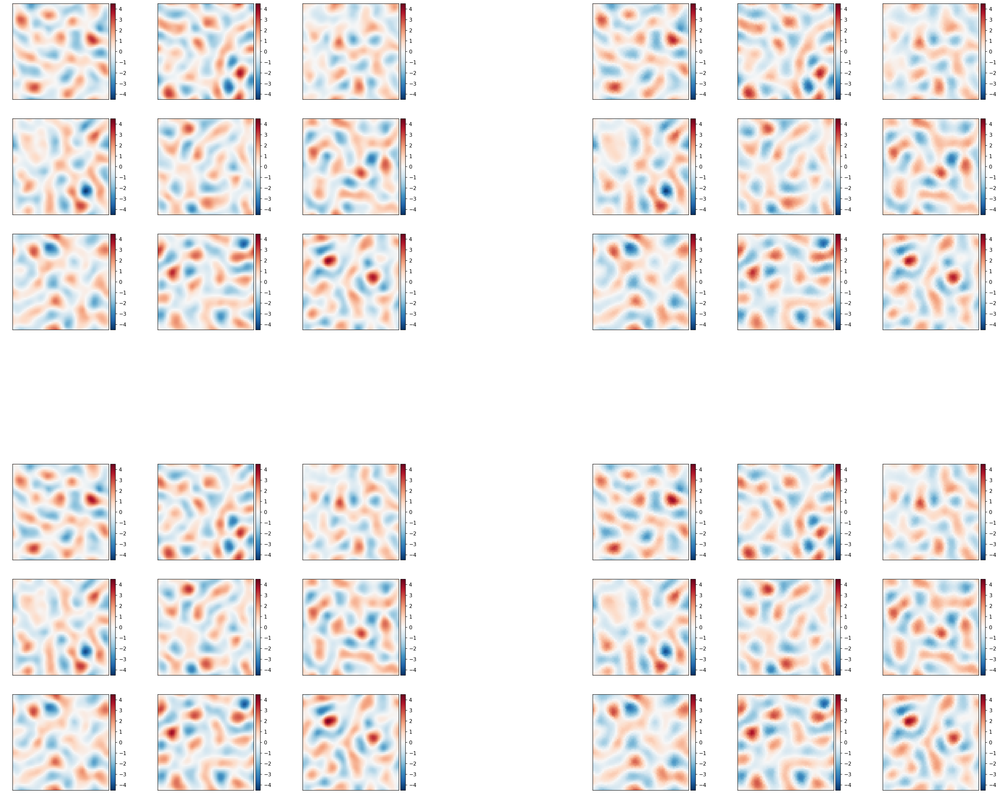

In [ ]:
n_row = 3
grec_idx = 0

fig,axs = plt.subplots(2*n_row+1,2*n_row+1,figsize=((2*n_row+1)*5,(2*n_row+1)*4),dpi=150)

axs[n_row,n_row].axis('off')

for i in range(n_row):
    axs[i,n_row].axis('off')
    axs[n_row+1+i,n_row].axis('off')
    axs[n_row,i].axis('off')
    axs[n_row,n_row+1+i].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        
        pf.imshowbar(fig,axs[i,j],
                     sim_rates_zsc[grec_idx,idx,0],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     sim_rates_zsc[grec_idx,idx,1],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)
        
        pf.imshowbar(fig,axs[n_row+i+1,j],
                     sim_rates_ssn_zsc[grec_idx,0,idx,0],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)
        pf.imshowbar(fig,axs[n_row+i+1,n_row+j+1],
                     sim_rates_ssn_zsc[grec_idx,0,idx,1],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)

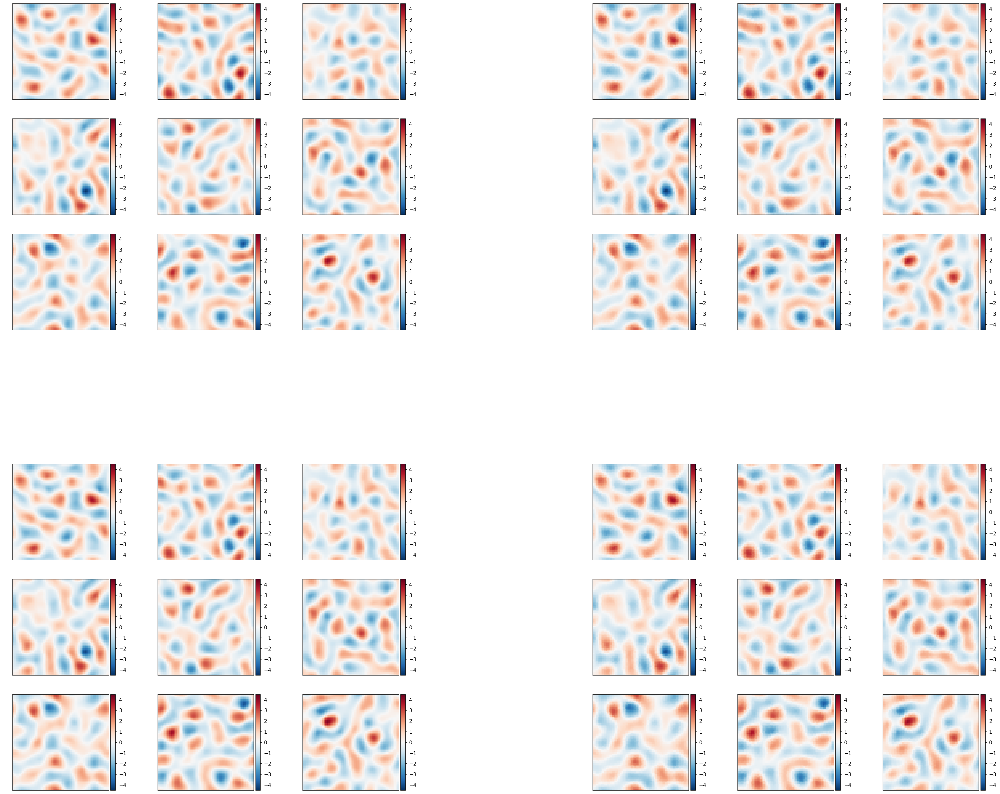

In [ ]:
n_row = 3
grec_idx = 1

fig,axs = plt.subplots(2*n_row+1,2*n_row+1,figsize=((2*n_row+1)*5,(2*n_row+1)*4),dpi=150)

axs[n_row,n_row].axis('off')

for i in range(n_row):
    axs[i,n_row].axis('off')
    axs[n_row+1+i,n_row].axis('off')
    axs[n_row,i].axis('off')
    axs[n_row,n_row+1+i].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        
        pf.imshowbar(fig,axs[i,j],
                     sim_rates_zsc[grec_idx,idx,0],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     sim_rates_zsc[grec_idx,idx,1],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)
        
        pf.imshowbar(fig,axs[n_row+i+1,j],
                     sim_rates_ssn_zsc[grec_idx,0,idx,0],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)
        pf.imshowbar(fig,axs[n_row+i+1,n_row+j+1],
                     sim_rates_ssn_zsc[grec_idx,0,idx,1],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)

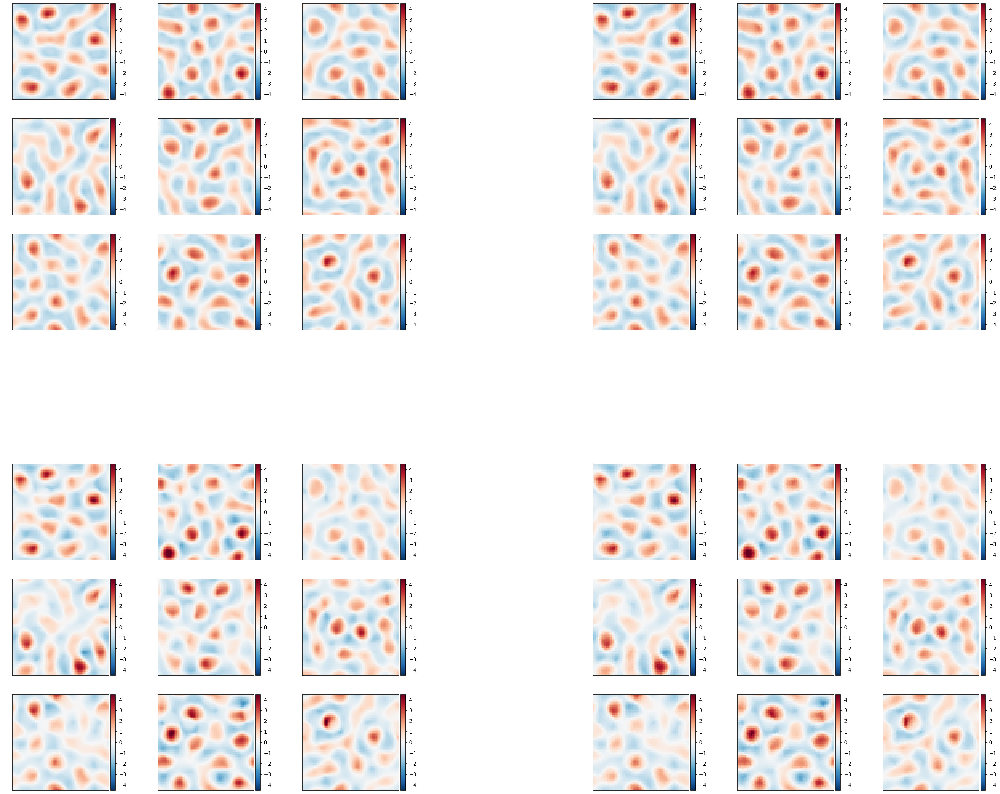

In [ ]:
n_row = 3
grec_idx = -1

fig,axs = plt.subplots(2*n_row+1,2*n_row+1,figsize=((2*n_row+1)*5,(2*n_row+1)*4),dpi=150)

axs[n_row,n_row].axis('off')

for i in range(n_row):
    axs[i,n_row].axis('off')
    axs[n_row+1+i,n_row].axis('off')
    axs[n_row,i].axis('off')
    axs[n_row,n_row+1+i].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        
        pf.imshowbar(fig,axs[i,j],
                     sim_rates_zsc[grec_idx,idx,0],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     sim_rates_zsc[grec_idx,idx,1],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)
        
        pf.imshowbar(fig,axs[n_row+i+1,j],
                     sim_rates_ssn_zsc[grec_idx,0,idx,0],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)
        pf.imshowbar(fig,axs[n_row+i+1,n_row+j+1],
                     sim_rates_ssn_zsc[grec_idx,0,idx,1],cmap='RdBu_r',
                     vmin=-4.5,vmax=4.5)

In [ ]:
seeds = np.arange(10)

sim_rates = [None]*len(seeds)

for seed_idx,seed in enumerate(seeds):
        with open('./../results/L23_corr_relu/seed={:d}.pkl'.format(seed), 'rb') as handle:
            res_dict = pickle.load(handle)
        sim_rates[seed_idx] = res_dict['rates']

sim_rates = np.array(sim_rates)

In [ ]:
sim_dims = np.zeros(len(seeds))

for seed_idx in range(len(seeds)):
    this_rates = sim_rates[seed_idx]
    this_rates_sub = (this_rates[:,0] - np.mean(this_rates[:,0],0)).reshape((-1,N4**2))
    this_ws = np.linalg.svd(this_rates_sub,compute_uv=False)
    this_ws = this_ws**2
    sim_dims[seed_idx] = np.sum(this_ws)**2/np.sum(this_ws**2)

In [ ]:
sim_dims

array([37.48131022, 38.69138002, 38.07765584, 36.98673556, 38.33885308,
       37.5973133 , 38.46374558, 37.43465361, 38.46694092, 37.92911114])

In [ ]:
n_row = 5

fig,axs = plt.subplots(n_row,2*n_row+1,figsize=((2*n_row+1)*4,n_row*4),dpi=150)

for i in range(n_row):
    axs[i,n_row].axis('off')
    for j in range(n_row):
        idx = i*n_row+j
        pf.imshowbar(fig,axs[i,j],
                     sim_rates[0,idx,0],cmap='RdBu_r',
                     vmin=np.min(sim_rates[0,:,0]),vmax=np.max(sim_rates[0,:,0]))
        pf.imshowbar(fig,axs[i,n_row+j+1],
                     sim_rates[0,idx,1],cmap='RdBu_r',
                     vmin=np.min(sim_rates[0,:,1]),vmax=np.max(sim_rates[0,:,1]))

In [ ]:
1.02 * np.dot(Whtro[:,:N4**2],rates[0,0].reshape((-1)))

array([4.19823016, 4.23295504, 4.25246178, ..., 4.0335327 , 4.05442488,
       4.08742693])

In [ ]:
1.02 * np.dot(Whtro[:,N4**2:],rates[0,1].reshape((-1)))

array([-4.27319491, -4.29854934, -4.31278174, ..., -4.07830045,
       -4.10333022, -4.13936061])

In [ ]:
inps[0].reshape((-1))

array([1.00148081, 0.99890033, 1.00663198, ..., 1.01196612, 1.00550331,
       1.00186039])

In [ ]:
rates[0].reshape((-1))

array([0.93613088, 0.94939574, 0.96457457, ..., 0.95638567, 0.96149259,
       0.96688214])

In [ ]:
Whomo[0,0]*2*np.pi*(80/N4*0.02375)**2

0.0028106196975009757

In [ ]:
Whomo[N4**2,0]*2*np.pi*(1.3333333333*0.02375)**2

0.0012156292070576579

In [ ]:
Whomo[0,N4**2]*2*np.pi*(1.3333333333*0.0175)**2

-0.0012156292070576579

In [ ]:
Whomo[N4**2,N4**2]*2*np.pi*(1.3333333333*0.0075)**2

-0.001166775392608523

In [ ]:
np.sum(Whomo[0,:N4**2])

4.496991516001565

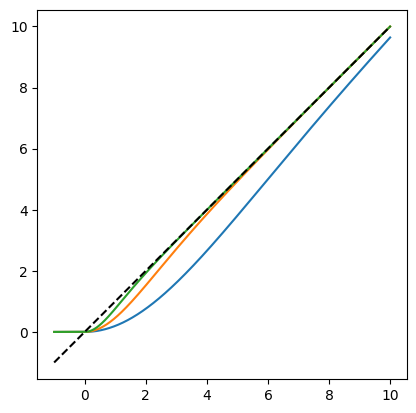

In [ ]:
xs = np.linspace(-1,10,1001)

plt.plot(xs,np.fmax(xs,0)*np.tanh(0.2*xs))
plt.plot(xs,np.fmax(xs,0)*np.tanh(0.5*xs))
plt.plot(xs,np.fmax(xs,0)*np.tanh(xs))
plt.plot(xs,xs,'k--')
plt.gca().set_aspect('equal')

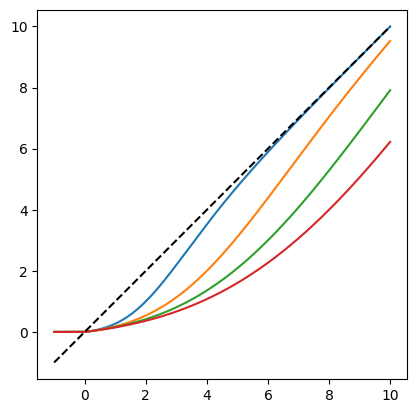

In [ ]:
xs = np.linspace(-1,10,1001)

for tht in [2,4,6,8]:
    plt.plot(xs,np.fmax(xs,0)*0.5*(np.tanh((xs-tht)/tht)+1))
plt.plot(xs,xs,'k--')
plt.gca().set_aspect('equal')

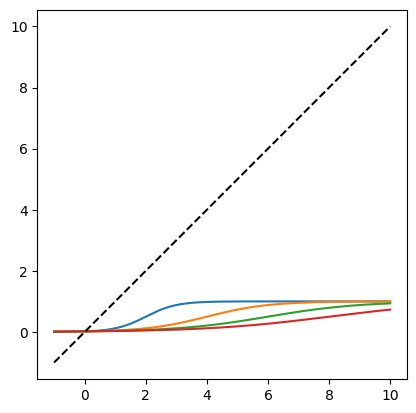

In [ ]:
xs = np.linspace(-1,10,1001)

for tht in [2,4,6,8]:
    plt.plot(xs,0.5*(np.tanh(2*(xs-tht)/tht)+1))
plt.plot(xs,xs,'k--')
plt.gca().set_aspect('equal')

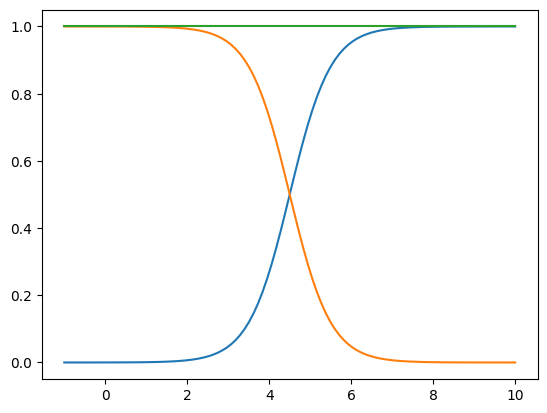

In [ ]:
xs = np.linspace(-1,10,101)

plt.plot(xs,0.5*(np.tanh(xs-4.5)+1))
plt.plot(xs,0.5*(np.tanh(-(xs-4.5))+1))
plt.plot(xs,0.5*(np.tanh(xs-4.5)+1)+0.5*(np.tanh(-(xs-4.5))+1))

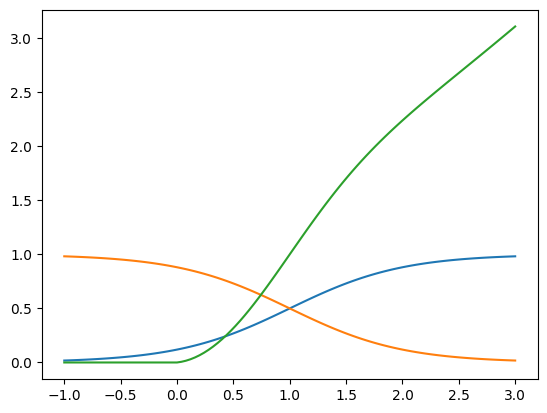

In [ ]:
xs = np.linspace(-1,3,101)

plt.plot(xs,0.5*(np.tanh(xs-1)+1))
plt.plot(xs,0.5*(np.tanh(-(xs-1))+1))
plt.plot(xs,np.fmax(xs,0)*0.5*(np.tanh(xs-1)+1)+np.fmax(xs,0)**2*0.5*(np.tanh(-(xs-1))+1))

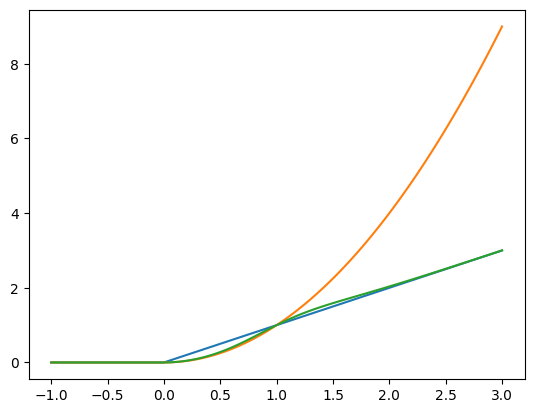

In [ ]:
xs = np.linspace(-1,3,101)

plt.plot(xs,np.fmax(xs,0))
plt.plot(xs,np.fmax(xs,0)**2)
plt.plot(xs,np.fmax(xs,0)*0.5*(np.tanh(2*(xs-1))+1)+np.fmax(xs,0)**2*0.5*(np.tanh(-2*(xs-1))+1))